In [1]:
import pandas as pd, numpy as np
import numpy as np
from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.utils import resample
from sklearn.preprocessing import StandardScaler,Normalizer
import matplotlib.pyplot as plt

In [2]:
file_paths="/kaggle/input/yield-curve-kirk/data_ann (2).csv"

In [3]:
df=pd.read_csv(file_paths)
df.columns = df.columns.str.replace(' ', '')
df.set_index("Date",inplace=True)
#df = df.loc[:,df.columns != "Date"]
df.interpolate(method ='linear', limit_direction ='both',inplace=True)

In [4]:
# develop the linear regression model and outputs
def linear_reg_model(feature_of_Interest):
    '''
    Input: the feature that we are interested in

    returns a dictionary of metrics of the model
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)

    '''
    #feature_of_Interest='GECU3M_lag_1'
    from sklearn.preprocessing import StandardScaler,Normalizer

    import pandas as pd, numpy as np
    import numpy as np
    from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_squared_error
    from sklearn.utils import resample
    from sklearn.preprocessing import StandardScaler,Normalizer
    import matplotlib.pyplot as plt
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, Dropout
    from tensorflow.keras.metrics import RootMeanSquaredError
    from sklearn.linear_model import LinearRegression

    df=pd.read_csv(file_paths)
    df.columns = df.columns.str.replace(' ', '')
    df.set_index("Date",inplace=True)
    #df = df.loc[:,df.columns != "Date"]
    df.interpolate(method ='linear', limit_direction ='both',inplace=True)

    # Load your CSV data (replace with your file path)
    data = df

    # Define the target column names (using the last 5 columns)
    target_columns = data.columns[-5:]

    # Generate lagged features for all features
    features_with_lags = pd.DataFrame()
    for feature in data.columns:
        lagged_features = []
        for i in range(1, 22,5):
            lagged_feature = data[feature].shift(i).rename(f"{feature}_lag_{i}")
            lagged_features.append(lagged_feature)
        # Include the feature itself
        lagged_features.append(data[feature])
        features_with_lags = pd.concat([features_with_lags, *lagged_features], axis=1)
    features_with_lags.interpolate(method ='linear', limit_direction ='both',inplace=True)

    # Apply LASSO feature selection separately per target and per forecasting horizon
    selected_features = pd.DataFrame(index=features_with_lags.columns)

    filtered_target_columns = [col for col in features_with_lags.columns if any(target in col for target in target_columns)]

    target_columns=[feature_of_Interest]
    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]
    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3,random_state=42)

    #lasso_model = Lasso(alpha=4)
    #lasso_model.fit(X_train, y_train)
    #selected_feature = np.sum(lasso_model.coef_ != 0)
    #selected_columns = X_train.columns[lasso_model.coef_ != 0]

    X_train=X_train#[list(selected_columns)]
    X_test=X_test#[list(selected_columns)]

    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    # Normalize train and test sets
    X_train_normalized = X_train
    X_test_normalized = X_test
    import random
    random.seed(42)  # Set a seed for reproducibility
    selected_indices = random.sample(range(len(X_test)), 50)

    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable

    from sklearn.linear_model import LinearRegression

    # Assuming X_train and y_train represent your original features and target
    # Fit a linear regression model
    model = LinearRegression()
    model.fit(X_train_normalized, y_train)

    # Use the trained model to predict new values based on X_train
    synthetic_data = model.predict(X_train_normalized)

    # Now y_train_combined contains the original target data along with synthetic data

    predictions = model.predict(X_test_forecast)
    mse = np.mean((predictions - y_test_forecast)**2)
    mse_values=(predictions - y_test_forecast)**2
    std_dev_mse = np.std((predictions - y_test_forecast.values)**2)
    mse_values=(predictions - y_test_forecast)**2
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'synthetic_data':synthetic_data,
           'mse_values':((predictions - y_test_forecast)**2).values.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'synthetic_data':synthetic_data,
           'mse_values':((predictions - y_test_forecast)**2).flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'synthetic_data':synthetic_data,
           'mse_values':((predictions - y_test_forecast)**2)
          }
    return a

In [5]:
#nn relfeat_non_normalized
def NN_RelFeat_non_normalized(feature_of_Interest):

    '''
    Input: the feature that we are interested in. 
    
    returns a dictionary of metrics of the model
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    '''
    import pandas as pd, numpy as np
    import numpy as np
    from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_squared_error
    from sklearn.utils import resample
    from sklearn.preprocessing import StandardScaler,Normalizer
    import matplotlib.pyplot as plt
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, Dropout
    from tensorflow.keras.metrics import RootMeanSquaredError
    from sklearn.linear_model import LinearRegression

    df=pd.read_csv(file_paths)
    df.columns = df.columns.str.replace(' ', '')
    df.set_index("Date",inplace=True)
    
    df.interpolate(method ='linear', limit_direction ='both',inplace=True)

    # Load your CSV data (replace with your file path)
    data = df

    # Define the target column names (using the last 5 columns)
    target_columns = data.columns[-5:]

    # Generate lagged features for all features
    features_with_lags = pd.DataFrame()
    for feature in data.columns:
        lagged_features = []
        for i in range(1, 22,5):
            lagged_feature = data[feature].shift(i).rename(f"{feature}_lag_{i}")
            lagged_features.append(lagged_feature)
        # Include the feature itself
        lagged_features.append(data[feature])
        features_with_lags = pd.concat([features_with_lags, *lagged_features], axis=1)
    features_with_lags.interpolate(method ='linear', limit_direction ='both',inplace=True)
    #features_with_lags.dropna(inplace=True)
    # Apply LASSO feature selection separately per target and per forecasting horizon
    selected_features = pd.DataFrame(index=features_with_lags.columns)
    #features_with_lags.dropna(inplace=True)
    filtered_target_columns = [col for col in features_with_lags.columns if any(target in col for target in target_columns)]

    target_columns=[feature_of_Interest]

    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]
    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3,random_state=42)
    
    lasso_model = Lasso(alpha=0.001)
    lasso_model.fit(X_train, y_train)
    
    selected_columns = X_train.columns[lasso_model.coef_ != 0]
    X_train=X_train[list(selected_columns)]
    X_test=X_test[list(selected_columns)]

    # Normalize train and test sets
    X_train_normalized = X_train
    X_test_normalized = X_test

    import random
    random.seed(42)  # Set a seed for reproducibility
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized.iloc[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable

    # Define the model architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='linear'))
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])

    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=800, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))

    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)

    predictions = model.predict(X_test_forecast)
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast.values)**2)
    mae = np.mean(np.abs(predictions - y_test_forecast.values))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast.values))
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))
    mse_values=(predictions - y_test_forecast)**2
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).values.flatten(), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).flatten(), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    return a

In [6]:
#nn relfeat
def NN_RelFeat(feature_of_Interest):
    
    '''
    Input: the feature that we are interested in. 
    
    returns a dictionary of metrics of the model
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    '''
    
    import pandas as pd, numpy as np
    import numpy as np
    from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_squared_error
    from sklearn.utils import resample
    from sklearn.preprocessing import StandardScaler,Normalizer
    import matplotlib.pyplot as plt
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, Dropout
    from tensorflow.keras.metrics import RootMeanSquaredError
    from sklearn.linear_model import LinearRegression
    
    df=pd.read_csv(file_paths)
    df.columns = df.columns.str.replace(' ', '')
    df.set_index("Date",inplace=True)
    #df = df.loc[:,df.columns != "Date"]
    df.interpolate(method ='linear', limit_direction ='both',inplace=True)
    
    # Load your CSV data (replace with your file path)
    data = df

    # Define the target column names (using the last 5 columns)
    target_columns = data.columns[-5:]

    # Generate lagged features for all features
    features_with_lags = pd.DataFrame()
    for feature in data.columns:
        lagged_features = []
        for i in range(1, 22,5):
            lagged_feature = data[feature].shift(i).rename(f"{feature}_lag_{i}")
            lagged_features.append(lagged_feature)
        # Include the feature itself
        lagged_features.append(data[feature])
        features_with_lags = pd.concat([features_with_lags, *lagged_features], axis=1)
    features_with_lags.interpolate(method ='linear', limit_direction ='both',inplace=True)
    #features_with_lags.dropna(inplace=True)
    # Apply LASSO feature selection separately per target and per forecasting horizon
    selected_features = pd.DataFrame(index=features_with_lags.columns)
    #features_with_lags.dropna(inplace=True)
    filtered_target_columns = [col for col in features_with_lags.columns if any(target in col for target in target_columns)]
    
    target_columns=[feature_of_Interest]

    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]
    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3,random_state=42)
    
    
    lasso_model = Lasso(alpha=0.001)
    lasso_model.fit(X_train, y_train)
    #selected_feature = np.sum(lasso_model.coef_ != 0)
    selected_columns = X_train.columns[lasso_model.coef_ != 0]

    X_train=X_train[list(selected_columns)]
    X_test=X_test[list(selected_columns)]

    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    # Normalize train and test sets
    X_train_normalized = X_train
    X_test_normalized = X_test
    
    import random
    random.seed(42)  # Set a seed for reproducibility
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable
    
    # Define the model architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    #model.add(Dropout(0.2))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='linear'))
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])
    
    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=500, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))
    
    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)
    
    predictions = model.predict(X_test_forecast)
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast.values)**2)
    mae = np.mean(np.abs(predictions - y_test_forecast.values))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast.values))
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))
    mse_values=(predictions - y_test_forecast)**2
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).values.flatten(), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).flatten(), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    return a

In [7]:
#nn TgtOnly
def NN_TgtOnly(feature_of_Interest):

    '''
    Input: the feature that we are interested in. 
    
    returns a dictionary of metrics of the model
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    '''

    import pandas as pd, numpy as np
    import numpy as np
    from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_squared_error
    from sklearn.utils import resample
    from sklearn.preprocessing import StandardScaler,Normalizer
    import matplotlib.pyplot as plt
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, Dropout
    from tensorflow.keras.metrics import RootMeanSquaredError
    from sklearn.linear_model import LinearRegression

    df=pd.read_csv(file_paths)
    df.columns = df.columns.str.replace(' ', '')
    df.set_index("Date",inplace=True)
    #df = df.loc[:,df.columns != "Date"]
    df.interpolate(method ='linear', limit_direction ='both',inplace=True)

    # Load your CSV data (replace with your file path)
    data = df

    # Define the target column names (using the last 5 columns)
    target_columns = data.columns[-5:]

    # Generate lagged features for all features
    features_with_lags = pd.DataFrame()
    for feature in data.columns:
        lagged_features = []
        for i in range(1, 22,5):
            lagged_feature = data[feature].shift(i).rename(f"{feature}_lag_{i}")
            lagged_features.append(lagged_feature)
        # Include the feature itself
        lagged_features.append(data[feature])
        features_with_lags = pd.concat([features_with_lags, *lagged_features], axis=1)
    features_with_lags.interpolate(method ='linear', limit_direction ='both',inplace=True)
    #features_with_lags.dropna(inplace=True)
    # Apply LASSO feature selection separately per target and per forecasting horizon
    selected_features = pd.DataFrame(index=features_with_lags.columns)
    #features_with_lags.dropna(inplace=True)
    filtered_target_columns = [col for col in features_with_lags.columns if any(target in col for target in target_columns)]

    target_columns=[feature_of_Interest]

    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]


    X_train, X_test, y_train, y_test = train_test_split(y[400:3400], y[400:3400], test_size=0.3, shuffle=True)
    # Assuming X_train and X_test are your feature sets
    scaler = StandardScaler()
    

    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Normalize train and test sets
    X_train_normalized = X_train
    X_test_normalized = X_test

    import random
    random.seed(42)  # Set a seed for reproducibility
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    #y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable

    # Define the model architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    #model.add(Dropout(0.2))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='linear'))
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])

    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=500, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))

    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)

    predictions = model.predict(X_test_forecast)
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast.values)**2)
    #std_dev_mse = np.std((predictions - y_test_forecast)**2)
    mae = np.mean(np.abs(predictions - y_test_forecast.values))
    #mae = np.mean(np.abs(predictions - y_test_forecast))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast.values))
    #std_dev_mae = np.std(np.abs(predictions - y_test_forecast))
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))
    mse_values=(predictions - y_test_forecast)**2
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).values.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2)
          }
    return a


In [8]:
#NN RelFeat+LRdata
def RealFeat_LRdata(feature_of_Interest):
    
    '''
    Input: the feature that we are interested in. 
    
    returns a dictionary of metrics of the model
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    '''
    
    
    import pandas as pd, numpy as np
    import numpy as np
    from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_squared_error
    from sklearn.utils import resample
    from sklearn.preprocessing import StandardScaler,Normalizer
    import matplotlib.pyplot as plt
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, Dropout
    from tensorflow.keras.metrics import RootMeanSquaredError
    from sklearn.linear_model import LinearRegression

    df=pd.read_csv(file_paths)
    df.columns = df.columns.str.replace(' ', '')
    df.set_index("Date",inplace=True)
    #df = df.loc[:,df.columns != "Date"]
    df.interpolate(method ='linear', limit_direction ='both',inplace=True)

    # Load your CSV data (replace with your file path)
    data = df

    # Define the target column names (using the last 5 columns)
    target_columns = data.columns[-5:]

    # Generate lagged features for all features
    features_with_lags = pd.DataFrame()
    for feature in data.columns:
        lagged_features = []
        for i in range(1, 22,5):
            lagged_feature = data[feature].shift(i).rename(f"{feature}_lag_{i}")
            lagged_features.append(lagged_feature)
        # Include the feature itself
        lagged_features.append(data[feature])
        features_with_lags = pd.concat([features_with_lags, *lagged_features], axis=1)
    features_with_lags.interpolate(method ='linear', limit_direction ='both',inplace=True)
    #features_with_lags.dropna(inplace=True)
    # Apply LASSO feature selection separately per target and per forecasting horizon
    selected_features = pd.DataFrame(index=features_with_lags.columns)
    #features_with_lags.dropna(inplace=True)
    filtered_target_columns = [col for col in features_with_lags.columns if any(target in col for target in target_columns)]

    target_columns=[feature_of_Interest]

    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]

    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3, shuffle=True)

    lasso_model = Lasso(alpha=0.001)
    lasso_model.fit(X_train, y_train)
    #selected_feature = np.sum(lasso_model.coef_ != 0)
    selected_columns = X_train.columns[lasso_model.coef_ != 0]

    X_train=X_train[list(selected_columns)]
    X_test=X_test[list(selected_columns)]

    scaler = StandardScaler()
    X_train1 = scaler.fit_transform(X_train)
    X_test1 = scaler.transform(X_test)
    # Normalize train and test sets
    X_train_normalized1 = X_train1
    X_test_normalized1 = X_test1

    ###################################################################################
    # Fit a linear regression model
    linear_reg_model1 = LinearRegression()
    linear_reg_model1.fit(X_train_normalized1, y_train)

    synthetic_data1 = linear_reg_model1.predict(X_train_normalized1)
    synthetic_data2 = linear_reg_model1.predict(X_test_normalized1)
    # Use the trained model to predict new values based on X_train
    synthetic_data1 = linear_reg_model1.predict(X_train_normalized1)
    X_train["LR_model"]=synthetic_data1
    X_test["LR_model"]=synthetic_data2
    #####################################################################################

    # Normalize train and test sets
    X_train_normalized = scaler.fit_transform(X_train)
    X_test_normalized = scaler.transform(X_test)

    import random
    random.seed(42)  # Set a seed for reproducibility
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable

    # Define the model architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    #model.add(Dropout(0.2))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='linear'))
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])

    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=500, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))

    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)

    predictions = model.predict(X_test_forecast)
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast)**2)
    mae = np.mean(np.abs(predictions - y_test_forecast))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast))
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))

    mse_values=(predictions - y_test_forecast)**2
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).values.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2)
          }

    return a
    

In [9]:
#nn TgtOnly + LRdata
def NN_TgtOnly_LRdata(feature_of_Interest):
    
    
    '''
    Input: the feature that we are interested in. 
    
    returns a dictionary of metrics of the model
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    '''
    
    import pandas as pd, numpy as np
    import numpy as np
    from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_squared_error
    from sklearn.utils import resample
    from sklearn.preprocessing import StandardScaler,Normalizer
    import matplotlib.pyplot as plt
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, Dropout
    from tensorflow.keras.metrics import RootMeanSquaredError
    from sklearn.linear_model import LinearRegression

    df=pd.read_csv(file_paths)
    df.columns = df.columns.str.replace(' ', '')
    df.set_index("Date",inplace=True)
    #df = df.loc[:,df.columns != "Date"]
    df.interpolate(method ='linear', limit_direction ='both',inplace=True)

    # Load your CSV data (replace with your file path)
    data = df

    # Define the target column names (using the last 5 columns)
    target_columns = data.columns[-5:]

    # Generate lagged features for all features
    features_with_lags = pd.DataFrame()
    for feature in data.columns:
        lagged_features = []
        for i in range(1, 22,5):
            lagged_feature = data[feature].shift(i).rename(f"{feature}_lag_{i}")
            lagged_features.append(lagged_feature)
        # Include the feature itself
        lagged_features.append(data[feature])
        features_with_lags = pd.concat([features_with_lags, *lagged_features], axis=1)
    features_with_lags.interpolate(method ='linear', limit_direction ='both',inplace=True)
    #features_with_lags.dropna(inplace=True)
    # Apply LASSO feature selection separately per target and per forecasting horizon
    selected_features = pd.DataFrame(index=features_with_lags.columns)
    #features_with_lags.dropna(inplace=True)
    filtered_target_columns = [col for col in features_with_lags.columns if any(target in col for target in target_columns)]

    target_columns=[feature_of_Interest]

    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]

    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3, shuffle=True)
    # Assuming X_train and X_test are feature sets

    #selected_features = pd.DataFrame(index=X_train.columns)
    lasso_model = Lasso(alpha=0.001)
    lasso_model.fit(X_train, y_train)
    #selected_feature = np.sum(lasso_model.coef_ != 0)
    selected_columns = X_train.columns[lasso_model.coef_ != 0]

    X_train=X_train[list(selected_columns)]
    X_test=X_test[list(selected_columns)]

    scaler = StandardScaler()
    X_train1 = scaler.fit_transform(X_train)
    X_test1 = scaler.transform(X_test)
    # Normalize train and test sets
    X_train_normalized1 = X_train1
    X_test_normalized1 = X_test1

    ###################################################################################
    # Fit a linear regression model
    linear_reg_model1 = LinearRegression()
    linear_reg_model1.fit(X_train_normalized1, y_train)

    # Use the trained model to predict new values based on X_train
    synthetic_data1 = linear_reg_model1.predict(X_train_normalized1)
    synthetic_data2 = linear_reg_model1.predict(X_test_normalized1)

    X_train["LR_model"]=synthetic_data1
    X_test["LR_model"]=synthetic_data2

    X_train[feature_of_Interest]=y_train
    X_test[feature_of_Interest]=y_test

    X_train_normalized = scaler.fit_transform(X_train)
    X_test_normalized = scaler.transform(X_test)
    import random
    random.seed(42)  # Set a seed for reproducibility
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable

    # Define the model architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    #model.add(Dropout(0.2))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='linear'))
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])

    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=500, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))

    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)

    predictions = model.predict(X_test_forecast)
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast)**2)
    mae = np.mean(np.abs(predictions - y_test_forecast))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast))
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))
    mse_values=(predictions - y_test_forecast)**2
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).values.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2)
          }
    return a

In [10]:
horizons=[1,6,11,16,21]
yields=['GECU3M_lag_','GECU2YR_lag_','GECU5YR_lag_','GECU10YR_lag_','GECU30YR_lag_']
list_mse=[]
fig_5={}
table4_data=[]
for i in horizons:
    by_maturity=[]
    for j in yields:
        #print(j+str(i))
        target_=j+str(i)
        a=linear_reg_model(target_)
        b=NN_RelFeat(target_)
        c=NN_TgtOnly(target_)
        d=RealFeat_LRdata(target_)
        e=NN_TgtOnly_LRdata(target_)
        if (i==1 and target_=='GECU10YR_lag_1'):#list_mse1[0][3][1]
            fig_5.update({'Actual_Yield':b['Actual_Yield'],'Predicted_Yield':b['Predicted_Yield'],'GECU10YR_lag_1':b})
            #fig_5.append([b['Actual_Yield'],b['Predicted_Yield']])
        by_maturity.append([a['mse_values'],b['mse_values'],c['mse_values'],d['mse_values'],e['mse_values']])
    list_mse.append(by_maturity)

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.213e+00, tolerance: 3.975e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 11ms/step - loss: 3.3512 - mae: 1.4748 - mse: 3.3512 - root_mean_squared_error: 1.8306 - val_loss: 0.5926 - val_mae: 0.5670 - val_mse: 0.5926 - val_root_mean_squared_error: 0.7698
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.4853 - mae: 0.4995 - mse: 0.4853 - root_mean_squared_error: 0.6966 - val_loss: 0.1945 - val_mae: 0.3310 - val_mse: 0.1945 - val_root_mean_squared_error: 0.4410
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1366 - mae: 0.2800 - mse: 0.1366 - root_mean_squared_error: 0.3696 - val_loss: 0.0707 - val_mae: 0.1897 - val_mse: 0.0707 - val_root_mean_squared_error: 0.2659
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0628 - mae: 0.1956 - mse: 0.0628 - root_mean_squared_error: 0.2506 - val_loss: 0.0465 - val_mae: 0.1542 - val_mse: 0.0465 - val_root_mean_squared_error: 0.2157
Epoch 5/500
33/33 [==============================] - 0s 4ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.355e+00, tolerance: 4.012e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.0160 - mae: 1.5838 - mse: 4.0160 - root_mean_squared_error: 2.0040 - val_loss: 1.0812 - val_mae: 0.7531 - val_mse: 1.0812 - val_root_mean_squared_error: 1.0398
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.5181 - mae: 0.5250 - mse: 0.5181 - root_mean_squared_error: 0.7198 - val_loss: 0.1555 - val_mae: 0.2951 - val_mse: 0.1555 - val_root_mean_squared_error: 0.3943
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1041 - mae: 0.2446 - mse: 0.1041 - root_mean_squared_error: 0.3227 - val_loss: 0.0648 - val_mae: 0.1873 - val_mse: 0.0648 - val_root_mean_squared_error: 0.2546
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0568 - mae: 0.1837 - mse: 0.0568 - root_mean_squared_error: 0.2384 - val_loss: 0.0451 - val_mae: 0.1502 - val_mse: 0.0451 - val_root_mean_squared_error: 0.2123
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.012e+00, tolerance: 3.955e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 3.0275 - mae: 1.3402 - mse: 3.0275 - root_mean_squared_error: 1.7400 - val_loss: 0.4513 - val_mae: 0.4842 - val_mse: 0.4513 - val_root_mean_squared_error: 0.6718
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2610 - mae: 0.3845 - mse: 0.2610 - root_mean_squared_error: 0.5109 - val_loss: 0.1066 - val_mae: 0.2702 - val_mse: 0.1066 - val_root_mean_squared_error: 0.3265
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0952 - mae: 0.2323 - mse: 0.0952 - root_mean_squared_error: 0.3085 - val_loss: 0.0658 - val_mae: 0.2135 - val_mse: 0.0658 - val_root_mean_squared_error: 0.2565
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0611 - mae: 0.1891 - mse: 0.0611 - root_mean_squared_error: 0.2472 - val_loss: 0.0503 - val_mae: 0.1832 - val_mse: 0.0503 - val_root_mean_squared_error: 0.2242
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.474e+00, tolerance: 3.274e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 3.2689 - mae: 1.5110 - mse: 3.2689 - root_mean_squared_error: 1.8080 - val_loss: 0.4811 - val_mae: 0.5760 - val_mse: 0.4811 - val_root_mean_squared_error: 0.6936
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.4163 - mae: 0.5026 - mse: 0.4163 - root_mean_squared_error: 0.6452 - val_loss: 0.2367 - val_mae: 0.3831 - val_mse: 0.2367 - val_root_mean_squared_error: 0.4865
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2002 - mae: 0.3397 - mse: 0.2002 - root_mean_squared_error: 0.4475 - val_loss: 0.1473 - val_mae: 0.3168 - val_mse: 0.1473 - val_root_mean_squared_error: 0.3837
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1333 - mae: 0.2704 - mse: 0.1333 - root_mean_squared_error: 0.3651 - val_loss: 0.0965 - val_mae: 0.2642 - val_mse: 0.0965 - val_root_mean_squared_error: 0.3106
Epoch 5/500
33/33 [==============================] - 0s 4ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.491e+00, tolerance: 3.303e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 3.8652 - mae: 1.6697 - mse: 3.8652 - root_mean_squared_error: 1.9660 - val_loss: 0.4932 - val_mae: 0.5593 - val_mse: 0.4932 - val_root_mean_squared_error: 0.7023
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.3845 - mae: 0.4844 - mse: 0.3845 - root_mean_squared_error: 0.6201 - val_loss: 0.1886 - val_mae: 0.3389 - val_mse: 0.1886 - val_root_mean_squared_error: 0.4343
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1648 - mae: 0.3117 - mse: 0.1648 - root_mean_squared_error: 0.4060 - val_loss: 0.1307 - val_mae: 0.3065 - val_mse: 0.1307 - val_root_mean_squared_error: 0.3616
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1205 - mae: 0.2676 - mse: 0.1205 - root_mean_squared_error: 0.3471 - val_loss: 0.1061 - val_mae: 0.2797 - val_mse: 0.1061 - val_root_mean_squared_error: 0.3258
Epoch 5/500
33/33 [==============================] - 0s 4ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.477e+00, tolerance: 3.311e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 3.5103 - mae: 1.6462 - mse: 3.5103 - root_mean_squared_error: 1.8736 - val_loss: 1.3971 - val_mae: 1.0395 - val_mse: 1.3971 - val_root_mean_squared_error: 1.1820
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.4619 - mae: 0.5195 - mse: 0.4619 - root_mean_squared_error: 0.6796 - val_loss: 0.1456 - val_mae: 0.3159 - val_mse: 0.1456 - val_root_mean_squared_error: 0.3816
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1293 - mae: 0.2844 - mse: 0.1293 - root_mean_squared_error: 0.3596 - val_loss: 0.0824 - val_mae: 0.2199 - val_mse: 0.0824 - val_root_mean_squared_error: 0.2871
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.0939 - mae: 0.2374 - mse: 0.0939 - root_mean_squared_error: 0.3065 - val_loss: 0.0647 - val_mae: 0.1955 - val_mse: 0.0647 - val_root_mean_squared_error: 0.2543
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.137e+00, tolerance: 2.071e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 4.0270 - mae: 1.7298 - mse: 4.0270 - root_mean_squared_error: 2.0068 - val_loss: 0.5302 - val_mae: 0.6106 - val_mse: 0.5302 - val_root_mean_squared_error: 0.7282
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2644 - mae: 0.3823 - mse: 0.2644 - root_mean_squared_error: 0.5142 - val_loss: 0.1522 - val_mae: 0.3202 - val_mse: 0.1522 - val_root_mean_squared_error: 0.3901
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1032 - mae: 0.2485 - mse: 0.1032 - root_mean_squared_error: 0.3213 - val_loss: 0.1134 - val_mae: 0.2721 - val_mse: 0.1134 - val_root_mean_squared_error: 0.3368
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0806 - mae: 0.2176 - mse: 0.0806 - root_mean_squared_error: 0.2839 - val_loss: 0.0896 - val_mae: 0.2343 - val_mse: 0.0896 - val_root_mean_squared_error: 0.2994
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.166e+00, tolerance: 2.113e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 5.3559 - mae: 2.0504 - mse: 5.3559 - root_mean_squared_error: 2.3143 - val_loss: 2.5599 - val_mae: 1.2999 - val_mse: 2.5599 - val_root_mean_squared_error: 1.6000
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 1.0198 - mae: 0.7737 - mse: 1.0198 - root_mean_squared_error: 1.0098 - val_loss: 0.3959 - val_mae: 0.4853 - val_mse: 0.3959 - val_root_mean_squared_error: 0.6292
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.2498 - mae: 0.3723 - mse: 0.2498 - root_mean_squared_error: 0.4998 - val_loss: 0.2460 - val_mae: 0.3592 - val_mse: 0.2460 - val_root_mean_squared_error: 0.4960
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1866 - mae: 0.3166 - mse: 0.1866 - root_mean_squared_error: 0.4319 - val_loss: 0.2093 - val_mae: 0.3315 - val_mse: 0.2093 - val_root_mean_squared_error: 0.4575
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.136e+00, tolerance: 2.103e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 5.1099 - mae: 2.0124 - mse: 5.1099 - root_mean_squared_error: 2.2605 - val_loss: 1.3748 - val_mae: 0.9848 - val_mse: 1.3748 - val_root_mean_squared_error: 1.1725
Epoch 2/500
33/33 [==============================] - 0s 5ms/step - loss: 0.7317 - mae: 0.6571 - mse: 0.7317 - root_mean_squared_error: 0.8554 - val_loss: 0.2969 - val_mae: 0.4081 - val_mse: 0.2969 - val_root_mean_squared_error: 0.5449
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3113 - mae: 0.4160 - mse: 0.3113 - root_mean_squared_error: 0.5580 - val_loss: 0.1729 - val_mae: 0.3279 - val_mse: 0.1729 - val_root_mean_squared_error: 0.4158
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2170 - mae: 0.3426 - mse: 0.2170 - root_mean_squared_error: 0.4659 - val_loss: 0.1299 - val_mae: 0.2804 - val_mse: 0.1299 - val_root_mean_squared_error: 0.3604
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.499e+00, tolerance: 1.288e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 7.4153 - mae: 2.4967 - mse: 7.4153 - root_mean_squared_error: 2.7231 - val_loss: 1.6854 - val_mae: 1.0847 - val_mse: 1.6854 - val_root_mean_squared_error: 1.2982
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.8518 - mae: 0.6993 - mse: 0.8518 - root_mean_squared_error: 0.9229 - val_loss: 0.4715 - val_mae: 0.5173 - val_mse: 0.4715 - val_root_mean_squared_error: 0.6866
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.2062 - mae: 0.3534 - mse: 0.2062 - root_mean_squared_error: 0.4541 - val_loss: 0.2279 - val_mae: 0.3760 - val_mse: 0.2279 - val_root_mean_squared_error: 0.4773
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1077 - mae: 0.2554 - mse: 0.1077 - root_mean_squared_error: 0.3282 - val_loss: 0.1753 - val_mae: 0.3372 - val_mse: 0.1753 - val_root_mean_squared_error: 0.4187
Epoch 5/500
33/33 [==============================] - 0s 4ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.505e+00, tolerance: 1.289e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 7.6809 - mae: 2.5274 - mse: 7.6809 - root_mean_squared_error: 2.7714 - val_loss: 3.5729 - val_mae: 1.6478 - val_mse: 3.5729 - val_root_mean_squared_error: 1.8902
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.4331 - mae: 0.9201 - mse: 1.4331 - root_mean_squared_error: 1.1971 - val_loss: 0.5441 - val_mae: 0.5981 - val_mse: 0.5441 - val_root_mean_squared_error: 0.7376
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2953 - mae: 0.4018 - mse: 0.2953 - root_mean_squared_error: 0.5434 - val_loss: 0.2305 - val_mae: 0.3639 - val_mse: 0.2305 - val_root_mean_squared_error: 0.4802
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1903 - mae: 0.3245 - mse: 0.1903 - root_mean_squared_error: 0.4362 - val_loss: 0.1672 - val_mae: 0.3180 - val_mse: 0.1672 - val_root_mean_squared_error: 0.4089
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.536e+00, tolerance: 1.323e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 8.7163 - mae: 2.7558 - mse: 8.7163 - root_mean_squared_error: 2.9523 - val_loss: 3.1866 - val_mae: 1.5991 - val_mse: 3.1866 - val_root_mean_squared_error: 1.7851
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.6901 - mae: 1.0167 - mse: 1.6901 - root_mean_squared_error: 1.3001 - val_loss: 0.4826 - val_mae: 0.5219 - val_mse: 0.4826 - val_root_mean_squared_error: 0.6947
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.4481 - mae: 0.5116 - mse: 0.4481 - root_mean_squared_error: 0.6694 - val_loss: 0.2355 - val_mae: 0.3749 - val_mse: 0.2355 - val_root_mean_squared_error: 0.4852
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2513 - mae: 0.3878 - mse: 0.2513 - root_mean_squared_error: 0.5013 - val_loss: 0.1779 - val_mae: 0.3155 - val_mse: 0.1779 - val_root_mean_squared_error: 0.4218
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.246e+00, tolerance: 1.135e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 10.3091 - mae: 2.9960 - mse: 10.3091 - root_mean_squared_error: 3.2108 - val_loss: 4.0802 - val_mae: 1.6728 - val_mse: 4.0802 - val_root_mean_squared_error: 2.0199
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.6658 - mae: 1.0015 - mse: 1.6658 - root_mean_squared_error: 1.2906 - val_loss: 1.0997 - val_mae: 0.8670 - val_mse: 1.0997 - val_root_mean_squared_error: 1.0487
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.4993 - mae: 0.5586 - mse: 0.4993 - root_mean_squared_error: 0.7066 - val_loss: 0.3560 - val_mae: 0.4679 - val_mse: 0.3560 - val_root_mean_squared_error: 0.5967
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.2407 - mae: 0.3866 - mse: 0.2407 - root_mean_squared_error: 0.4906 - val_loss: 0.2103 - val_mae: 0.3528 - val_mse: 0.2103 - val_root_mean_squared_error: 0.4586
Epoch 5/500
33/33 [==============================] - 0s 4m

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.236e+00, tolerance: 1.145e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 10.4214 - mae: 2.9452 - mse: 10.4214 - root_mean_squared_error: 3.2282 - val_loss: 3.2644 - val_mae: 1.5394 - val_mse: 3.2644 - val_root_mean_squared_error: 1.8068
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.5458 - mae: 0.9592 - mse: 1.5458 - root_mean_squared_error: 1.2433 - val_loss: 0.6405 - val_mae: 0.5672 - val_mse: 0.6405 - val_root_mean_squared_error: 0.8003
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.3837 - mae: 0.4563 - mse: 0.3837 - root_mean_squared_error: 0.6194 - val_loss: 0.1931 - val_mae: 0.3236 - val_mse: 0.1931 - val_root_mean_squared_error: 0.4394
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1504 - mae: 0.2952 - mse: 0.1504 - root_mean_squared_error: 0.3878 - val_loss: 0.1183 - val_mae: 0.2684 - val_mse: 0.1183 - val_root_mean_squared_error: 0.3440
Epoch 5/500
33/33 [==============================] - 0s 4

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.256e+00, tolerance: 1.162e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 11.9919 - mae: 3.2499 - mse: 11.9919 - root_mean_squared_error: 3.4629 - val_loss: 6.0591 - val_mae: 2.1462 - val_mse: 6.0591 - val_root_mean_squared_error: 2.4615
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 2.3183 - mae: 1.2168 - mse: 2.3183 - root_mean_squared_error: 1.5226 - val_loss: 0.8558 - val_mae: 0.7121 - val_mse: 0.8558 - val_root_mean_squared_error: 0.9251
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3361 - mae: 0.4520 - mse: 0.3361 - root_mean_squared_error: 0.5797 - val_loss: 0.3549 - val_mae: 0.4412 - val_mse: 0.3549 - val_root_mean_squared_error: 0.5958
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1915 - mae: 0.3475 - mse: 0.1915 - root_mean_squared_error: 0.4376 - val_loss: 0.2162 - val_mae: 0.3564 - val_mse: 0.2162 - val_root_mean_squared_error: 0.4650
Epoch 5/500
33/33 [==============================] - 0s 4

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.166e+00, tolerance: 3.962e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 5.1804 - mae: 1.7856 - mse: 5.1804 - root_mean_squared_error: 2.2760 - val_loss: 1.1456 - val_mae: 0.8997 - val_mse: 1.1456 - val_root_mean_squared_error: 1.0703
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.1197 - mae: 0.7201 - mse: 1.1197 - root_mean_squared_error: 1.0582 - val_loss: 0.3310 - val_mae: 0.4016 - val_mse: 0.3310 - val_root_mean_squared_error: 0.5753
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.3613 - mae: 0.4287 - mse: 0.3613 - root_mean_squared_error: 0.6011 - val_loss: 0.1370 - val_mae: 0.2694 - val_mse: 0.1370 - val_root_mean_squared_error: 0.3702
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1098 - mae: 0.2504 - mse: 0.1098 - root_mean_squared_error: 0.3313 - val_loss: 0.0425 - val_mae: 0.1704 - val_mse: 0.0425 - val_root_mean_squared_error: 0.2063
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.994e+00, tolerance: 3.993e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 5.6618 - mae: 1.9535 - mse: 5.6618 - root_mean_squared_error: 2.3794 - val_loss: 2.9067 - val_mae: 1.3161 - val_mse: 2.9067 - val_root_mean_squared_error: 1.7049
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.2547 - mae: 0.7953 - mse: 1.2547 - root_mean_squared_error: 1.1201 - val_loss: 0.2678 - val_mae: 0.3902 - val_mse: 0.2678 - val_root_mean_squared_error: 0.5175
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1190 - mae: 0.2566 - mse: 0.1190 - root_mean_squared_error: 0.3450 - val_loss: 0.0437 - val_mae: 0.1744 - val_mse: 0.0437 - val_root_mean_squared_error: 0.2092
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0414 - mae: 0.1564 - mse: 0.0414 - root_mean_squared_error: 0.2034 - val_loss: 0.0248 - val_mae: 0.1332 - val_mse: 0.0248 - val_root_mean_squared_error: 0.1574
Epoch 5/500
33/33 [==============================] - 0s 4ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.156e+00, tolerance: 3.993e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.1671 - mae: 1.5970 - mse: 4.1671 - root_mean_squared_error: 2.0413 - val_loss: 1.3161 - val_mae: 0.8763 - val_mse: 1.3161 - val_root_mean_squared_error: 1.1472
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.6641 - mae: 0.5918 - mse: 0.6641 - root_mean_squared_error: 0.8149 - val_loss: 0.2771 - val_mae: 0.4373 - val_mse: 0.2771 - val_root_mean_squared_error: 0.5264
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1586 - mae: 0.3085 - mse: 0.1586 - root_mean_squared_error: 0.3982 - val_loss: 0.0930 - val_mae: 0.2472 - val_mse: 0.0930 - val_root_mean_squared_error: 0.3049
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0647 - mae: 0.1920 - mse: 0.0647 - root_mean_squared_error: 0.2544 - val_loss: 0.0474 - val_mae: 0.1509 - val_mse: 0.0474 - val_root_mean_squared_error: 0.2178
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.600e+00, tolerance: 3.268e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.4103 - mae: 1.7713 - mse: 4.4103 - root_mean_squared_error: 2.1001 - val_loss: 0.6062 - val_mae: 0.6634 - val_mse: 0.6062 - val_root_mean_squared_error: 0.7786
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3636 - mae: 0.4729 - mse: 0.3636 - root_mean_squared_error: 0.6030 - val_loss: 0.1615 - val_mae: 0.3256 - val_mse: 0.1615 - val_root_mean_squared_error: 0.4019
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1646 - mae: 0.3102 - mse: 0.1646 - root_mean_squared_error: 0.4057 - val_loss: 0.1266 - val_mae: 0.3055 - val_mse: 0.1266 - val_root_mean_squared_error: 0.3558
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1122 - mae: 0.2649 - mse: 0.1122 - root_mean_squared_error: 0.3349 - val_loss: 0.0939 - val_mae: 0.2616 - val_mse: 0.0939 - val_root_mean_squared_error: 0.3064
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.613e+00, tolerance: 3.275e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 3.0034 - mae: 1.4790 - mse: 3.0034 - root_mean_squared_error: 1.7330 - val_loss: 0.4865 - val_mae: 0.5602 - val_mse: 0.4865 - val_root_mean_squared_error: 0.6975
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.3622 - mae: 0.4751 - mse: 0.3622 - root_mean_squared_error: 0.6018 - val_loss: 0.1853 - val_mae: 0.3522 - val_mse: 0.1853 - val_root_mean_squared_error: 0.4305
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1253 - mae: 0.2799 - mse: 0.1253 - root_mean_squared_error: 0.3539 - val_loss: 0.0744 - val_mae: 0.2266 - val_mse: 0.0744 - val_root_mean_squared_error: 0.2728
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0710 - mae: 0.2118 - mse: 0.0710 - root_mean_squared_error: 0.2665 - val_loss: 0.0437 - val_mae: 0.1711 - val_mse: 0.0437 - val_root_mean_squared_error: 0.2092
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.595e+00, tolerance: 3.278e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 2.7136 - mae: 1.3891 - mse: 2.7136 - root_mean_squared_error: 1.6473 - val_loss: 0.6480 - val_mae: 0.6818 - val_mse: 0.6480 - val_root_mean_squared_error: 0.8050
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3602 - mae: 0.4790 - mse: 0.3602 - root_mean_squared_error: 0.6002 - val_loss: 0.1313 - val_mae: 0.2949 - val_mse: 0.1313 - val_root_mean_squared_error: 0.3624
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1096 - mae: 0.2655 - mse: 0.1096 - root_mean_squared_error: 0.3311 - val_loss: 0.0665 - val_mae: 0.2055 - val_mse: 0.0665 - val_root_mean_squared_error: 0.2578
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0608 - mae: 0.1957 - mse: 0.0608 - root_mean_squared_error: 0.2465 - val_loss: 0.0486 - val_mae: 0.1657 - val_mse: 0.0486 - val_root_mean_squared_error: 0.2205
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.173e+00, tolerance: 2.059e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 11ms/step - loss: 4.9463 - mae: 1.9415 - mse: 4.9463 - root_mean_squared_error: 2.2240 - val_loss: 1.3518 - val_mae: 1.0094 - val_mse: 1.3518 - val_root_mean_squared_error: 1.1627
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.5514 - mae: 0.5768 - mse: 0.5514 - root_mean_squared_error: 0.7425 - val_loss: 0.1994 - val_mae: 0.3650 - val_mse: 0.1994 - val_root_mean_squared_error: 0.4465
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1453 - mae: 0.3037 - mse: 0.1453 - root_mean_squared_error: 0.3812 - val_loss: 0.0830 - val_mae: 0.2306 - val_mse: 0.0830 - val_root_mean_squared_error: 0.2881
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.0759 - mae: 0.2146 - mse: 0.0759 - root_mean_squared_error: 0.2755 - val_loss: 0.0626 - val_mae: 0.2024 - val_mse: 0.0626 - val_root_mean_squared_error: 0.2503
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.180e+00, tolerance: 2.075e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.0945 - mae: 1.7355 - mse: 4.0945 - root_mean_squared_error: 2.0235 - val_loss: 0.9375 - val_mae: 0.7525 - val_mse: 0.9375 - val_root_mean_squared_error: 0.9683
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.4057 - mae: 0.4689 - mse: 0.4057 - root_mean_squared_error: 0.6369 - val_loss: 0.1440 - val_mae: 0.2852 - val_mse: 0.1440 - val_root_mean_squared_error: 0.3795
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1173 - mae: 0.2639 - mse: 0.1173 - root_mean_squared_error: 0.3425 - val_loss: 0.0775 - val_mae: 0.2158 - val_mse: 0.0775 - val_root_mean_squared_error: 0.2784
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0755 - mae: 0.2183 - mse: 0.0755 - root_mean_squared_error: 0.2749 - val_loss: 0.0568 - val_mae: 0.1816 - val_mse: 0.0568 - val_root_mean_squared_error: 0.2384
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.175e+00, tolerance: 2.119e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.1885 - mae: 1.7847 - mse: 4.1885 - root_mean_squared_error: 2.0466 - val_loss: 1.0671 - val_mae: 0.7800 - val_mse: 1.0671 - val_root_mean_squared_error: 1.0330
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.5249 - mae: 0.5459 - mse: 0.5249 - root_mean_squared_error: 0.7245 - val_loss: 0.4040 - val_mae: 0.4879 - val_mse: 0.4040 - val_root_mean_squared_error: 0.6356
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2426 - mae: 0.3602 - mse: 0.2426 - root_mean_squared_error: 0.4925 - val_loss: 0.2555 - val_mae: 0.3587 - val_mse: 0.2555 - val_root_mean_squared_error: 0.5055
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1716 - mae: 0.2976 - mse: 0.1716 - root_mean_squared_error: 0.4142 - val_loss: 0.2143 - val_mae: 0.3093 - val_mse: 0.2143 - val_root_mean_squared_error: 0.4629
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.409e+00, tolerance: 1.277e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 7.9000 - mae: 2.5451 - mse: 7.9000 - root_mean_squared_error: 2.8107 - val_loss: 2.9545 - val_mae: 1.4211 - val_mse: 2.9545 - val_root_mean_squared_error: 1.7189
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.8904 - mae: 0.7407 - mse: 0.8904 - root_mean_squared_error: 0.9436 - val_loss: 0.3304 - val_mae: 0.4993 - val_mse: 0.3304 - val_root_mean_squared_error: 0.5748
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.2081 - mae: 0.3539 - mse: 0.2081 - root_mean_squared_error: 0.4562 - val_loss: 0.1926 - val_mae: 0.3321 - val_mse: 0.1926 - val_root_mean_squared_error: 0.4389
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1350 - mae: 0.2760 - mse: 0.1350 - root_mean_squared_error: 0.3675 - val_loss: 0.1281 - val_mae: 0.2780 - val_mse: 0.1281 - val_root_mean_squared_error: 0.3580
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.405e+00, tolerance: 1.287e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 8.4124 - mae: 2.6220 - mse: 8.4124 - root_mean_squared_error: 2.9004 - val_loss: 1.8607 - val_mae: 1.1521 - val_mse: 1.8607 - val_root_mean_squared_error: 1.3641
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 1.1415 - mae: 0.8195 - mse: 1.1415 - root_mean_squared_error: 1.0684 - val_loss: 0.3179 - val_mae: 0.4789 - val_mse: 0.3179 - val_root_mean_squared_error: 0.5638
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.2568 - mae: 0.4196 - mse: 0.2568 - root_mean_squared_error: 0.5067 - val_loss: 0.1643 - val_mae: 0.3374 - val_mse: 0.1643 - val_root_mean_squared_error: 0.4054
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1277 - mae: 0.2922 - mse: 0.1277 - root_mean_squared_error: 0.3574 - val_loss: 0.1175 - val_mae: 0.2780 - val_mse: 0.1175 - val_root_mean_squared_error: 0.3427
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.457e+00, tolerance: 1.313e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 6.5418 - mae: 2.2421 - mse: 6.5418 - root_mean_squared_error: 2.5577 - val_loss: 1.8315 - val_mae: 1.2427 - val_mse: 1.8315 - val_root_mean_squared_error: 1.3533
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.4733 - mae: 0.5429 - mse: 0.4733 - root_mean_squared_error: 0.6880 - val_loss: 0.1367 - val_mae: 0.3278 - val_mse: 0.1367 - val_root_mean_squared_error: 0.3698
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1110 - mae: 0.2652 - mse: 0.1110 - root_mean_squared_error: 0.3332 - val_loss: 0.0827 - val_mae: 0.2263 - val_mse: 0.0827 - val_root_mean_squared_error: 0.2876
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.0783 - mae: 0.2198 - mse: 0.0783 - root_mean_squared_error: 0.2799 - val_loss: 0.0626 - val_mae: 0.1944 - val_mse: 0.0626 - val_root_mean_squared_error: 0.2502
Epoch 5/500
33/33 [==============================] - 0s 4ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.130e+00, tolerance: 1.122e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 9.0694 - mae: 2.7808 - mse: 9.0694 - root_mean_squared_error: 3.0115 - val_loss: 2.1342 - val_mae: 1.2515 - val_mse: 2.1342 - val_root_mean_squared_error: 1.4609
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.9869 - mae: 0.8060 - mse: 0.9869 - root_mean_squared_error: 0.9934 - val_loss: 0.4561 - val_mae: 0.5579 - val_mse: 0.4561 - val_root_mean_squared_error: 0.6753
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2888 - mae: 0.4342 - mse: 0.2888 - root_mean_squared_error: 0.5374 - val_loss: 0.2542 - val_mae: 0.4039 - val_mse: 0.2542 - val_root_mean_squared_error: 0.5042
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1917 - mae: 0.3454 - mse: 0.1917 - root_mean_squared_error: 0.4378 - val_loss: 0.2162 - val_mae: 0.3737 - val_mse: 0.2162 - val_root_mean_squared_error: 0.4649
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.155e+00, tolerance: 1.143e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 9.3608 - mae: 2.8299 - mse: 9.3608 - root_mean_squared_error: 3.0595 - val_loss: 2.9980 - val_mae: 1.4284 - val_mse: 2.9980 - val_root_mean_squared_error: 1.7315
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.7158 - mae: 0.9564 - mse: 1.7158 - root_mean_squared_error: 1.3099 - val_loss: 0.8433 - val_mae: 0.6576 - val_mse: 0.8433 - val_root_mean_squared_error: 0.9183
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.4735 - mae: 0.5119 - mse: 0.4735 - root_mean_squared_error: 0.6881 - val_loss: 0.1916 - val_mae: 0.3504 - val_mse: 0.1916 - val_root_mean_squared_error: 0.4377
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1542 - mae: 0.3163 - mse: 0.1542 - root_mean_squared_error: 0.3927 - val_loss: 0.1309 - val_mae: 0.2800 - val_mse: 0.1309 - val_root_mean_squared_error: 0.3619
Epoch 5/500
33/33 [==============================] - 0s 4ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.119e+00, tolerance: 1.136e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 11.7863 - mae: 3.1144 - mse: 11.7863 - root_mean_squared_error: 3.4331 - val_loss: 5.6212 - val_mae: 1.9129 - val_mse: 5.6212 - val_root_mean_squared_error: 2.3709
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 2.6421 - mae: 1.2204 - mse: 2.6421 - root_mean_squared_error: 1.6254 - val_loss: 1.1181 - val_mae: 0.7981 - val_mse: 1.1181 - val_root_mean_squared_error: 1.0574
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.6254 - mae: 0.6093 - mse: 0.6254 - root_mean_squared_error: 0.7908 - val_loss: 0.5596 - val_mae: 0.5982 - val_mse: 0.5596 - val_root_mean_squared_error: 0.7480
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.2554 - mae: 0.3896 - mse: 0.2554 - root_mean_squared_error: 0.5054 - val_loss: 0.3709 - val_mae: 0.4712 - val_mse: 0.3709 - val_root_mean_squared_error: 0.6090
Epoch 5/500
33/33 [==============================] - 0s 4m

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.455e+00, tolerance: 3.955e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 4.3869 - mae: 1.6816 - mse: 4.3869 - root_mean_squared_error: 2.0945 - val_loss: 0.9261 - val_mae: 0.7171 - val_mse: 0.9261 - val_root_mean_squared_error: 0.9623
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.5956 - mae: 0.5941 - mse: 0.5956 - root_mean_squared_error: 0.7718 - val_loss: 0.3600 - val_mae: 0.4743 - val_mse: 0.3600 - val_root_mean_squared_error: 0.6000
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.2058 - mae: 0.3520 - mse: 0.2058 - root_mean_squared_error: 0.4536 - val_loss: 0.1194 - val_mae: 0.2752 - val_mse: 0.1194 - val_root_mean_squared_error: 0.3455
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.0913 - mae: 0.2475 - mse: 0.0913 - root_mean_squared_error: 0.3021 - val_loss: 0.0613 - val_mae: 0.2067 - val_mse: 0.0613 - val_root_mean_squared_error: 0.2476
Epoch 5/500
33/33 [==============================] - 0s 4ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.412e+00, tolerance: 3.960e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 14ms/step - loss: 4.9459 - mae: 1.8199 - mse: 4.9459 - root_mean_squared_error: 2.2239 - val_loss: 2.1847 - val_mae: 1.0983 - val_mse: 2.1847 - val_root_mean_squared_error: 1.4781
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.7248 - mae: 0.5690 - mse: 0.7248 - root_mean_squared_error: 0.8514 - val_loss: 0.2199 - val_mae: 0.3540 - val_mse: 0.2199 - val_root_mean_squared_error: 0.4689
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1404 - mae: 0.2927 - mse: 0.1404 - root_mean_squared_error: 0.3747 - val_loss: 0.1441 - val_mae: 0.2846 - val_mse: 0.1441 - val_root_mean_squared_error: 0.3796
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0802 - mae: 0.2169 - mse: 0.0802 - root_mean_squared_error: 0.2832 - val_loss: 0.1317 - val_mae: 0.2601 - val_mse: 0.1317 - val_root_mean_squared_error: 0.3629
Epoch 5/500
33/33 [==============================] - 0s 4ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.280e+00, tolerance: 3.973e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 6.5622 - mae: 1.9859 - mse: 6.5622 - root_mean_squared_error: 2.5617 - val_loss: 1.3521 - val_mae: 0.7916 - val_mse: 1.3521 - val_root_mean_squared_error: 1.1628
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.1462 - mae: 0.6627 - mse: 1.1462 - root_mean_squared_error: 1.0706 - val_loss: 0.4825 - val_mae: 0.4551 - val_mse: 0.4825 - val_root_mean_squared_error: 0.6946
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.2216 - mae: 0.3354 - mse: 0.2216 - root_mean_squared_error: 0.4707 - val_loss: 0.1065 - val_mae: 0.2401 - val_mse: 0.1065 - val_root_mean_squared_error: 0.3264
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0560 - mae: 0.1855 - mse: 0.0560 - root_mean_squared_error: 0.2367 - val_loss: 0.0799 - val_mae: 0.1979 - val_mse: 0.0799 - val_root_mean_squared_error: 0.2826
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.539e+00, tolerance: 3.260e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 4.5802 - mae: 1.7643 - mse: 4.5802 - root_mean_squared_error: 2.1401 - val_loss: 0.9175 - val_mae: 0.7433 - val_mse: 0.9175 - val_root_mean_squared_error: 0.9578
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.6222 - mae: 0.6353 - mse: 0.6222 - root_mean_squared_error: 0.7888 - val_loss: 0.3412 - val_mae: 0.4657 - val_mse: 0.3412 - val_root_mean_squared_error: 0.5841
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.2478 - mae: 0.3846 - mse: 0.2478 - root_mean_squared_error: 0.4978 - val_loss: 0.1692 - val_mae: 0.3216 - val_mse: 0.1692 - val_root_mean_squared_error: 0.4114
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1216 - mae: 0.2677 - mse: 0.1216 - root_mean_squared_error: 0.3487 - val_loss: 0.0911 - val_mae: 0.2387 - val_mse: 0.0911 - val_root_mean_squared_error: 0.3019
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.544e+00, tolerance: 3.301e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 4.1039 - mae: 1.7274 - mse: 4.1039 - root_mean_squared_error: 2.0258 - val_loss: 0.9024 - val_mae: 0.8308 - val_mse: 0.9024 - val_root_mean_squared_error: 0.9500
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.3634 - mae: 0.4762 - mse: 0.3634 - root_mean_squared_error: 0.6028 - val_loss: 0.2073 - val_mae: 0.3447 - val_mse: 0.2073 - val_root_mean_squared_error: 0.4553
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1575 - mae: 0.2999 - mse: 0.1575 - root_mean_squared_error: 0.3969 - val_loss: 0.1099 - val_mae: 0.2536 - val_mse: 0.1099 - val_root_mean_squared_error: 0.3316
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1014 - mae: 0.2434 - mse: 0.1014 - root_mean_squared_error: 0.3185 - val_loss: 0.0751 - val_mae: 0.2248 - val_mse: 0.0751 - val_root_mean_squared_error: 0.2740
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.541e+00, tolerance: 3.302e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 2.9598 - mae: 1.4159 - mse: 2.9598 - root_mean_squared_error: 1.7204 - val_loss: 0.5683 - val_mae: 0.5631 - val_mse: 0.5683 - val_root_mean_squared_error: 0.7539
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3941 - mae: 0.4993 - mse: 0.3941 - root_mean_squared_error: 0.6278 - val_loss: 0.2129 - val_mae: 0.3721 - val_mse: 0.2129 - val_root_mean_squared_error: 0.4614
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1607 - mae: 0.3284 - mse: 0.1607 - root_mean_squared_error: 0.4009 - val_loss: 0.1057 - val_mae: 0.2666 - val_mse: 0.1057 - val_root_mean_squared_error: 0.3251
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0910 - mae: 0.2513 - mse: 0.0910 - root_mean_squared_error: 0.3017 - val_loss: 0.0649 - val_mae: 0.2184 - val_mse: 0.0649 - val_root_mean_squared_error: 0.2548
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.212e+00, tolerance: 2.041e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.9604 - mae: 1.9935 - mse: 4.9604 - root_mean_squared_error: 2.2272 - val_loss: 1.7093 - val_mae: 1.1278 - val_mse: 1.7093 - val_root_mean_squared_error: 1.3074
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.5728 - mae: 0.5976 - mse: 0.5728 - root_mean_squared_error: 0.7568 - val_loss: 0.1260 - val_mae: 0.2578 - val_mse: 0.1260 - val_root_mean_squared_error: 0.3550
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1480 - mae: 0.2919 - mse: 0.1480 - root_mean_squared_error: 0.3847 - val_loss: 0.0755 - val_mae: 0.2121 - val_mse: 0.0755 - val_root_mean_squared_error: 0.2748
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1039 - mae: 0.2439 - mse: 0.1039 - root_mean_squared_error: 0.3223 - val_loss: 0.0500 - val_mae: 0.1746 - val_mse: 0.0500 - val_root_mean_squared_error: 0.2237
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.318e+00, tolerance: 2.141e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 4.5558 - mae: 1.8845 - mse: 4.5558 - root_mean_squared_error: 2.1344 - val_loss: 1.0868 - val_mae: 0.8941 - val_mse: 1.0868 - val_root_mean_squared_error: 1.0425
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.5461 - mae: 0.5625 - mse: 0.5461 - root_mean_squared_error: 0.7390 - val_loss: 0.3363 - val_mae: 0.4370 - val_mse: 0.3363 - val_root_mean_squared_error: 0.5799
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1793 - mae: 0.3089 - mse: 0.1793 - root_mean_squared_error: 0.4235 - val_loss: 0.1605 - val_mae: 0.3050 - val_mse: 0.1605 - val_root_mean_squared_error: 0.4006
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1005 - mae: 0.2348 - mse: 0.1005 - root_mean_squared_error: 0.3170 - val_loss: 0.1226 - val_mae: 0.2657 - val_mse: 0.1226 - val_root_mean_squared_error: 0.3502
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.273e+00, tolerance: 2.148e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.3398 - mae: 1.7759 - mse: 4.3398 - root_mean_squared_error: 2.0832 - val_loss: 0.6567 - val_mae: 0.6493 - val_mse: 0.6567 - val_root_mean_squared_error: 0.8104
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.4324 - mae: 0.5072 - mse: 0.4324 - root_mean_squared_error: 0.6576 - val_loss: 0.1230 - val_mae: 0.2986 - val_mse: 0.1230 - val_root_mean_squared_error: 0.3507
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1393 - mae: 0.2876 - mse: 0.1393 - root_mean_squared_error: 0.3732 - val_loss: 0.0788 - val_mae: 0.2314 - val_mse: 0.0788 - val_root_mean_squared_error: 0.2808
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.0896 - mae: 0.2301 - mse: 0.0896 - root_mean_squared_error: 0.2994 - val_loss: 0.0629 - val_mae: 0.2026 - val_mse: 0.0629 - val_root_mean_squared_error: 0.2508
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.463e+00, tolerance: 1.265e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 8.1696 - mae: 2.6163 - mse: 8.1696 - root_mean_squared_error: 2.8582 - val_loss: 4.2898 - val_mae: 1.7793 - val_mse: 4.2898 - val_root_mean_squared_error: 2.0712
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.5662 - mae: 0.9570 - mse: 1.5662 - root_mean_squared_error: 1.2515 - val_loss: 0.3044 - val_mae: 0.4453 - val_mse: 0.3044 - val_root_mean_squared_error: 0.5517
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.2209 - mae: 0.3767 - mse: 0.2209 - root_mean_squared_error: 0.4699 - val_loss: 0.1486 - val_mae: 0.3099 - val_mse: 0.1486 - val_root_mean_squared_error: 0.3855
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1314 - mae: 0.2828 - mse: 0.1314 - root_mean_squared_error: 0.3624 - val_loss: 0.1015 - val_mae: 0.2582 - val_mse: 0.1015 - val_root_mean_squared_error: 0.3186
Epoch 5/500
33/33 [==============================] - 0s 4ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.479e+00, tolerance: 1.290e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 7.7740 - mae: 2.5210 - mse: 7.7740 - root_mean_squared_error: 2.7882 - val_loss: 1.6319 - val_mae: 0.9525 - val_mse: 1.6319 - val_root_mean_squared_error: 1.2774
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.9863 - mae: 0.7279 - mse: 0.9863 - root_mean_squared_error: 0.9931 - val_loss: 0.3663 - val_mae: 0.4865 - val_mse: 0.3663 - val_root_mean_squared_error: 0.6052
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.2583 - mae: 0.3545 - mse: 0.2583 - root_mean_squared_error: 0.5082 - val_loss: 0.1612 - val_mae: 0.3178 - val_mse: 0.1612 - val_root_mean_squared_error: 0.4016
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1620 - mae: 0.2655 - mse: 0.1620 - root_mean_squared_error: 0.4024 - val_loss: 0.1386 - val_mae: 0.2767 - val_mse: 0.1386 - val_root_mean_squared_error: 0.3723
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.464e+00, tolerance: 1.300e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 8.1641 - mae: 2.5992 - mse: 8.1641 - root_mean_squared_error: 2.8573 - val_loss: 2.7449 - val_mae: 1.3655 - val_mse: 2.7449 - val_root_mean_squared_error: 1.6568
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 1.2729 - mae: 0.8633 - mse: 1.2729 - root_mean_squared_error: 1.1282 - val_loss: 0.4979 - val_mae: 0.5758 - val_mse: 0.4979 - val_root_mean_squared_error: 0.7056
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3008 - mae: 0.3962 - mse: 0.3008 - root_mean_squared_error: 0.5485 - val_loss: 0.1608 - val_mae: 0.3241 - val_mse: 0.1608 - val_root_mean_squared_error: 0.4010
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1893 - mae: 0.2991 - mse: 0.1893 - root_mean_squared_error: 0.4351 - val_loss: 0.1331 - val_mae: 0.3023 - val_mse: 0.1331 - val_root_mean_squared_error: 0.3648
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.224e+00, tolerance: 1.111e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 9.3097 - mae: 2.8123 - mse: 9.3097 - root_mean_squared_error: 3.0512 - val_loss: 2.3392 - val_mae: 1.2865 - val_mse: 2.3392 - val_root_mean_squared_error: 1.5294
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.3489 - mae: 0.8661 - mse: 1.3489 - root_mean_squared_error: 1.1614 - val_loss: 0.5844 - val_mae: 0.5568 - val_mse: 0.5844 - val_root_mean_squared_error: 0.7644
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3466 - mae: 0.4446 - mse: 0.3466 - root_mean_squared_error: 0.5888 - val_loss: 0.2198 - val_mae: 0.3383 - val_mse: 0.2198 - val_root_mean_squared_error: 0.4688
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1479 - mae: 0.2961 - mse: 0.1479 - root_mean_squared_error: 0.3846 - val_loss: 0.1456 - val_mae: 0.2946 - val_mse: 0.1456 - val_root_mean_squared_error: 0.3815
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.250e+00, tolerance: 1.108e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 10.8493 - mae: 3.0709 - mse: 10.8493 - root_mean_squared_error: 3.2938 - val_loss: 3.3151 - val_mae: 1.5568 - val_mse: 3.3151 - val_root_mean_squared_error: 1.8208
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 1.5228 - mae: 0.9838 - mse: 1.5228 - root_mean_squared_error: 1.2340 - val_loss: 0.6520 - val_mae: 0.6928 - val_mse: 0.6520 - val_root_mean_squared_error: 0.8075
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.5298 - mae: 0.5646 - mse: 0.5298 - root_mean_squared_error: 0.7279 - val_loss: 0.2919 - val_mae: 0.4601 - val_mse: 0.2919 - val_root_mean_squared_error: 0.5403
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.3382 - mae: 0.4433 - mse: 0.3382 - root_mean_squared_error: 0.5815 - val_loss: 0.1875 - val_mae: 0.3625 - val_mse: 0.1875 - val_root_mean_squared_error: 0.4331
Epoch 5/500
33/33 [==============================] - 0s 3m

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.260e+00, tolerance: 1.133e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 10.9956 - mae: 3.0793 - mse: 10.9956 - root_mean_squared_error: 3.3160 - val_loss: 4.2920 - val_mae: 1.6432 - val_mse: 4.2920 - val_root_mean_squared_error: 2.0717
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.9565 - mae: 1.0639 - mse: 1.9565 - root_mean_squared_error: 1.3987 - val_loss: 0.7018 - val_mae: 0.6575 - val_mse: 0.7018 - val_root_mean_squared_error: 0.8377
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.4637 - mae: 0.5117 - mse: 0.4637 - root_mean_squared_error: 0.6810 - val_loss: 0.3066 - val_mae: 0.4194 - val_mse: 0.3066 - val_root_mean_squared_error: 0.5537
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2638 - mae: 0.3963 - mse: 0.2638 - root_mean_squared_error: 0.5136 - val_loss: 0.2058 - val_mae: 0.3523 - val_mse: 0.2058 - val_root_mean_squared_error: 0.4536
Epoch 5/500
33/33 [==============================] - 0s 3m

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.151e+00, tolerance: 3.941e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 3.8012 - mae: 1.5800 - mse: 3.8012 - root_mean_squared_error: 1.9497 - val_loss: 0.7573 - val_mae: 0.7169 - val_mse: 0.7573 - val_root_mean_squared_error: 0.8702
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3782 - mae: 0.4885 - mse: 0.3782 - root_mean_squared_error: 0.6149 - val_loss: 0.1591 - val_mae: 0.3389 - val_mse: 0.1591 - val_root_mean_squared_error: 0.3989
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1324 - mae: 0.2861 - mse: 0.1324 - root_mean_squared_error: 0.3639 - val_loss: 0.1067 - val_mae: 0.2672 - val_mse: 0.1067 - val_root_mean_squared_error: 0.3267
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0892 - mae: 0.2258 - mse: 0.0892 - root_mean_squared_error: 0.2986 - val_loss: 0.0766 - val_mae: 0.2209 - val_mse: 0.0766 - val_root_mean_squared_error: 0.2768
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.955e+00, tolerance: 3.963e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 3.2494 - mae: 1.4511 - mse: 3.2494 - root_mean_squared_error: 1.8026 - val_loss: 0.4615 - val_mae: 0.5312 - val_mse: 0.4615 - val_root_mean_squared_error: 0.6793
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2482 - mae: 0.3927 - mse: 0.2482 - root_mean_squared_error: 0.4982 - val_loss: 0.0996 - val_mae: 0.2609 - val_mse: 0.0996 - val_root_mean_squared_error: 0.3156
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.0741 - mae: 0.2139 - mse: 0.0741 - root_mean_squared_error: 0.2721 - val_loss: 0.0576 - val_mae: 0.1810 - val_mse: 0.0576 - val_root_mean_squared_error: 0.2400
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0500 - mae: 0.1748 - mse: 0.0500 - root_mean_squared_error: 0.2235 - val_loss: 0.0513 - val_mae: 0.1733 - val_mse: 0.0513 - val_root_mean_squared_error: 0.2265
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.474e+00, tolerance: 3.870e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 11ms/step - loss: 3.1409 - mae: 1.4072 - mse: 3.1409 - root_mean_squared_error: 1.7723 - val_loss: 1.0775 - val_mae: 0.8619 - val_mse: 1.0775 - val_root_mean_squared_error: 1.0380
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.2787 - mae: 0.4141 - mse: 0.2787 - root_mean_squared_error: 0.5280 - val_loss: 0.1466 - val_mae: 0.2946 - val_mse: 0.1466 - val_root_mean_squared_error: 0.3829
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.0851 - mae: 0.2205 - mse: 0.0851 - root_mean_squared_error: 0.2917 - val_loss: 0.0882 - val_mae: 0.2158 - val_mse: 0.0882 - val_root_mean_squared_error: 0.2970
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0552 - mae: 0.1787 - mse: 0.0552 - root_mean_squared_error: 0.2349 - val_loss: 0.0635 - val_mae: 0.1885 - val_mse: 0.0635 - val_root_mean_squared_error: 0.2520
Epoch 5/500
33/33 [==============================] - 0s 4ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.628e+00, tolerance: 3.246e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.3213 - mae: 1.7671 - mse: 4.3213 - root_mean_squared_error: 2.0788 - val_loss: 1.5421 - val_mae: 1.0317 - val_mse: 1.5421 - val_root_mean_squared_error: 1.2418
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.8666 - mae: 0.7376 - mse: 0.8666 - root_mean_squared_error: 0.9309 - val_loss: 0.7321 - val_mae: 0.6440 - val_mse: 0.7321 - val_root_mean_squared_error: 0.8556
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.3680 - mae: 0.4645 - mse: 0.3680 - root_mean_squared_error: 0.6067 - val_loss: 0.2672 - val_mae: 0.3861 - val_mse: 0.2672 - val_root_mean_squared_error: 0.5169
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1399 - mae: 0.2930 - mse: 0.1399 - root_mean_squared_error: 0.3740 - val_loss: 0.1125 - val_mae: 0.2580 - val_mse: 0.1125 - val_root_mean_squared_error: 0.3354
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.630e+00, tolerance: 3.271e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 2.6853 - mae: 1.3685 - mse: 2.6853 - root_mean_squared_error: 1.6387 - val_loss: 0.3767 - val_mae: 0.4807 - val_mse: 0.3767 - val_root_mean_squared_error: 0.6137
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1982 - mae: 0.3630 - mse: 0.1982 - root_mean_squared_error: 0.4452 - val_loss: 0.1388 - val_mae: 0.3097 - val_mse: 0.1388 - val_root_mean_squared_error: 0.3725
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0988 - mae: 0.2576 - mse: 0.0988 - root_mean_squared_error: 0.3143 - val_loss: 0.0980 - val_mae: 0.2554 - val_mse: 0.0980 - val_root_mean_squared_error: 0.3130
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0703 - mae: 0.2127 - mse: 0.0703 - root_mean_squared_error: 0.2652 - val_loss: 0.0855 - val_mae: 0.2316 - val_mse: 0.0855 - val_root_mean_squared_error: 0.2924
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.677e+00, tolerance: 3.369e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 3.8976 - mae: 1.7130 - mse: 3.8976 - root_mean_squared_error: 1.9742 - val_loss: 1.4706 - val_mae: 0.9727 - val_mse: 1.4706 - val_root_mean_squared_error: 1.2127
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.8639 - mae: 0.7649 - mse: 0.8639 - root_mean_squared_error: 0.9295 - val_loss: 0.4851 - val_mae: 0.5337 - val_mse: 0.4851 - val_root_mean_squared_error: 0.6965
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2457 - mae: 0.3736 - mse: 0.2457 - root_mean_squared_error: 0.4956 - val_loss: 0.2475 - val_mae: 0.3027 - val_mse: 0.2475 - val_root_mean_squared_error: 0.4975
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1322 - mae: 0.2615 - mse: 0.1322 - root_mean_squared_error: 0.3635 - val_loss: 0.1771 - val_mae: 0.2442 - val_mse: 0.1771 - val_root_mean_squared_error: 0.4208
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.219e+00, tolerance: 2.031e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 5.8087 - mae: 2.1532 - mse: 5.8087 - root_mean_squared_error: 2.4101 - val_loss: 2.2945 - val_mae: 1.2619 - val_mse: 2.2945 - val_root_mean_squared_error: 1.5148
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 1.0837 - mae: 0.8020 - mse: 1.0837 - root_mean_squared_error: 1.0410 - val_loss: 0.2514 - val_mae: 0.4187 - val_mse: 0.2514 - val_root_mean_squared_error: 0.5014
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.2398 - mae: 0.3754 - mse: 0.2398 - root_mean_squared_error: 0.4897 - val_loss: 0.1132 - val_mae: 0.2674 - val_mse: 0.1132 - val_root_mean_squared_error: 0.3364
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1447 - mae: 0.2848 - mse: 0.1447 - root_mean_squared_error: 0.3804 - val_loss: 0.0654 - val_mae: 0.2053 - val_mse: 0.0654 - val_root_mean_squared_error: 0.2558
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.227e+00, tolerance: 2.090e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 5.8759 - mae: 2.0637 - mse: 5.8759 - root_mean_squared_error: 2.4240 - val_loss: 3.1825 - val_mae: 1.3739 - val_mse: 3.1825 - val_root_mean_squared_error: 1.7840
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.1624 - mae: 0.7866 - mse: 1.1624 - root_mean_squared_error: 1.0781 - val_loss: 0.4088 - val_mae: 0.5263 - val_mse: 0.4088 - val_root_mean_squared_error: 0.6394
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2555 - mae: 0.3784 - mse: 0.2555 - root_mean_squared_error: 0.5055 - val_loss: 0.1051 - val_mae: 0.2711 - val_mse: 0.1051 - val_root_mean_squared_error: 0.3242
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1462 - mae: 0.2834 - mse: 0.1462 - root_mean_squared_error: 0.3824 - val_loss: 0.0886 - val_mae: 0.2364 - val_mse: 0.0886 - val_root_mean_squared_error: 0.2977
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.210e+00, tolerance: 2.057e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.8923 - mae: 1.9314 - mse: 4.8923 - root_mean_squared_error: 2.2119 - val_loss: 1.4320 - val_mae: 0.8129 - val_mse: 1.4320 - val_root_mean_squared_error: 1.1967
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.6795 - mae: 0.5779 - mse: 0.6795 - root_mean_squared_error: 0.8243 - val_loss: 0.5092 - val_mae: 0.4464 - val_mse: 0.5092 - val_root_mean_squared_error: 0.7136
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2417 - mae: 0.3387 - mse: 0.2417 - root_mean_squared_error: 0.4916 - val_loss: 0.2561 - val_mae: 0.3270 - val_mse: 0.2561 - val_root_mean_squared_error: 0.5061
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1718 - mae: 0.2831 - mse: 0.1718 - root_mean_squared_error: 0.4145 - val_loss: 0.1999 - val_mae: 0.2847 - val_mse: 0.1999 - val_root_mean_squared_error: 0.4471
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.474e+00, tolerance: 1.264e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 6.7831 - mae: 2.3596 - mse: 6.7831 - root_mean_squared_error: 2.6044 - val_loss: 1.8910 - val_mae: 1.0899 - val_mse: 1.8910 - val_root_mean_squared_error: 1.3751
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.6328 - mae: 0.6146 - mse: 0.6328 - root_mean_squared_error: 0.7955 - val_loss: 0.2934 - val_mae: 0.4691 - val_mse: 0.2934 - val_root_mean_squared_error: 0.5416
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1624 - mae: 0.3162 - mse: 0.1624 - root_mean_squared_error: 0.4030 - val_loss: 0.1025 - val_mae: 0.2637 - val_mse: 0.1025 - val_root_mean_squared_error: 0.3202
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1019 - mae: 0.2479 - mse: 0.1019 - root_mean_squared_error: 0.3192 - val_loss: 0.0870 - val_mae: 0.2409 - val_mse: 0.0870 - val_root_mean_squared_error: 0.2950
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.529e+00, tolerance: 1.321e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 8.9967 - mae: 2.7386 - mse: 8.9967 - root_mean_squared_error: 2.9994 - val_loss: 3.3335 - val_mae: 1.6148 - val_mse: 3.3335 - val_root_mean_squared_error: 1.8258
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 1.2964 - mae: 0.9121 - mse: 1.2964 - root_mean_squared_error: 1.1386 - val_loss: 0.3433 - val_mae: 0.4699 - val_mse: 0.3433 - val_root_mean_squared_error: 0.5859
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2355 - mae: 0.3796 - mse: 0.2355 - root_mean_squared_error: 0.4853 - val_loss: 0.1907 - val_mae: 0.3322 - val_mse: 0.1907 - val_root_mean_squared_error: 0.4366
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1418 - mae: 0.2958 - mse: 0.1418 - root_mean_squared_error: 0.3766 - val_loss: 0.1333 - val_mae: 0.2807 - val_mse: 0.1333 - val_root_mean_squared_error: 0.3651
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.469e+00, tolerance: 1.275e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 6.8932 - mae: 2.2905 - mse: 6.8932 - root_mean_squared_error: 2.6255 - val_loss: 1.7851 - val_mae: 1.1508 - val_mse: 1.7851 - val_root_mean_squared_error: 1.3361
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.6622 - mae: 0.6348 - mse: 0.6622 - root_mean_squared_error: 0.8138 - val_loss: 0.1982 - val_mae: 0.3648 - val_mse: 0.1982 - val_root_mean_squared_error: 0.4452
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1622 - mae: 0.3186 - mse: 0.1622 - root_mean_squared_error: 0.4027 - val_loss: 0.1260 - val_mae: 0.2789 - val_mse: 0.1260 - val_root_mean_squared_error: 0.3549
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1117 - mae: 0.2633 - mse: 0.1117 - root_mean_squared_error: 0.3342 - val_loss: 0.1062 - val_mae: 0.2608 - val_mse: 0.1062 - val_root_mean_squared_error: 0.3259
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.203e+00, tolerance: 1.110e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 10.4414 - mae: 2.9529 - mse: 10.4414 - root_mean_squared_error: 3.2313 - val_loss: 4.9685 - val_mae: 1.9928 - val_mse: 4.9685 - val_root_mean_squared_error: 2.2290
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.3509 - mae: 0.8912 - mse: 1.3509 - root_mean_squared_error: 1.1623 - val_loss: 0.1903 - val_mae: 0.3497 - val_mse: 0.1903 - val_root_mean_squared_error: 0.4363
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2114 - mae: 0.3458 - mse: 0.2114 - root_mean_squared_error: 0.4598 - val_loss: 0.1185 - val_mae: 0.2765 - val_mse: 0.1185 - val_root_mean_squared_error: 0.3443
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1381 - mae: 0.2871 - mse: 0.1381 - root_mean_squared_error: 0.3716 - val_loss: 0.0897 - val_mae: 0.2287 - val_mse: 0.0897 - val_root_mean_squared_error: 0.2996
Epoch 5/500
33/33 [==============================] - 0s 3m

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.242e+00, tolerance: 1.161e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 9.0925 - mae: 2.7709 - mse: 9.0925 - root_mean_squared_error: 3.0154 - val_loss: 2.1708 - val_mae: 1.1664 - val_mse: 2.1708 - val_root_mean_squared_error: 1.4734
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 1.3775 - mae: 0.8874 - mse: 1.3775 - root_mean_squared_error: 1.1737 - val_loss: 0.4395 - val_mae: 0.4970 - val_mse: 0.4395 - val_root_mean_squared_error: 0.6630
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.3714 - mae: 0.4694 - mse: 0.3714 - root_mean_squared_error: 0.6094 - val_loss: 0.1411 - val_mae: 0.3043 - val_mse: 0.1411 - val_root_mean_squared_error: 0.3756
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1825 - mae: 0.3367 - mse: 0.1825 - root_mean_squared_error: 0.4272 - val_loss: 0.1036 - val_mae: 0.2643 - val_mse: 0.1036 - val_root_mean_squared_error: 0.3218
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.260e+00, tolerance: 1.156e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 9.0133 - mae: 2.7571 - mse: 9.0133 - root_mean_squared_error: 3.0022 - val_loss: 3.6332 - val_mae: 1.6892 - val_mse: 3.6332 - val_root_mean_squared_error: 1.9061
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.2695 - mae: 0.8479 - mse: 1.2695 - root_mean_squared_error: 1.1267 - val_loss: 0.5181 - val_mae: 0.5899 - val_mse: 0.5181 - val_root_mean_squared_error: 0.7198
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3515 - mae: 0.4600 - mse: 0.3515 - root_mean_squared_error: 0.5928 - val_loss: 0.1829 - val_mae: 0.3170 - val_mse: 0.1829 - val_root_mean_squared_error: 0.4277
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1950 - mae: 0.3379 - mse: 0.1950 - root_mean_squared_error: 0.4416 - val_loss: 0.1197 - val_mae: 0.2610 - val_mse: 0.1197 - val_root_mean_squared_error: 0.3460
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.013e+00, tolerance: 3.936e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 3.7690 - mae: 1.5856 - mse: 3.7690 - root_mean_squared_error: 1.9414 - val_loss: 0.6898 - val_mae: 0.7457 - val_mse: 0.6898 - val_root_mean_squared_error: 0.8306
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.2807 - mae: 0.4142 - mse: 0.2807 - root_mean_squared_error: 0.5298 - val_loss: 0.0929 - val_mae: 0.2530 - val_mse: 0.0929 - val_root_mean_squared_error: 0.3049
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0942 - mae: 0.2312 - mse: 0.0942 - root_mean_squared_error: 0.3069 - val_loss: 0.0689 - val_mae: 0.2031 - val_mse: 0.0689 - val_root_mean_squared_error: 0.2625
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0750 - mae: 0.2060 - mse: 0.0750 - root_mean_squared_error: 0.2739 - val_loss: 0.0612 - val_mae: 0.1917 - val_mse: 0.0612 - val_root_mean_squared_error: 0.2473
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.582e+00, tolerance: 4.010e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 4.4644 - mae: 1.7563 - mse: 4.4644 - root_mean_squared_error: 2.1129 - val_loss: 1.7545 - val_mae: 1.0470 - val_mse: 1.7545 - val_root_mean_squared_error: 1.3246
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.6529 - mae: 0.5879 - mse: 0.6529 - root_mean_squared_error: 0.8080 - val_loss: 0.1532 - val_mae: 0.3251 - val_mse: 0.1532 - val_root_mean_squared_error: 0.3914
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1259 - mae: 0.2792 - mse: 0.1259 - root_mean_squared_error: 0.3548 - val_loss: 0.1225 - val_mae: 0.2661 - val_mse: 0.1225 - val_root_mean_squared_error: 0.3500
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.0832 - mae: 0.2219 - mse: 0.0832 - root_mean_squared_error: 0.2885 - val_loss: 0.0875 - val_mae: 0.2242 - val_mse: 0.0875 - val_root_mean_squared_error: 0.2958
Epoch 5/500
33/33 [==============================] - 0s 4ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.012e+00, tolerance: 4.020e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 3.7717 - mae: 1.4414 - mse: 3.7717 - root_mean_squared_error: 1.9421 - val_loss: 0.4963 - val_mae: 0.6162 - val_mse: 0.4963 - val_root_mean_squared_error: 0.7045
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2335 - mae: 0.3802 - mse: 0.2335 - root_mean_squared_error: 0.4832 - val_loss: 0.1444 - val_mae: 0.2891 - val_mse: 0.1444 - val_root_mean_squared_error: 0.3801
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0826 - mae: 0.2230 - mse: 0.0826 - root_mean_squared_error: 0.2874 - val_loss: 0.0742 - val_mae: 0.2047 - val_mse: 0.0742 - val_root_mean_squared_error: 0.2724
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0577 - mae: 0.1846 - mse: 0.0577 - root_mean_squared_error: 0.2401 - val_loss: 0.0460 - val_mae: 0.1656 - val_mse: 0.0460 - val_root_mean_squared_error: 0.2145
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.693e+00, tolerance: 3.243e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 3.2881 - mae: 1.5246 - mse: 3.2881 - root_mean_squared_error: 1.8133 - val_loss: 1.0003 - val_mae: 0.8896 - val_mse: 1.0003 - val_root_mean_squared_error: 1.0002
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.4017 - mae: 0.5140 - mse: 0.4017 - root_mean_squared_error: 0.6338 - val_loss: 0.1174 - val_mae: 0.2825 - val_mse: 0.1174 - val_root_mean_squared_error: 0.3427
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0974 - mae: 0.2498 - mse: 0.0974 - root_mean_squared_error: 0.3122 - val_loss: 0.0601 - val_mae: 0.1985 - val_mse: 0.0601 - val_root_mean_squared_error: 0.2451
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0588 - mae: 0.1919 - mse: 0.0588 - root_mean_squared_error: 0.2425 - val_loss: 0.0412 - val_mae: 0.1585 - val_mse: 0.0412 - val_root_mean_squared_error: 0.2030
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.726e+00, tolerance: 3.335e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 3.7775 - mae: 1.6744 - mse: 3.7775 - root_mean_squared_error: 1.9436 - val_loss: 0.9115 - val_mae: 0.7882 - val_mse: 0.9115 - val_root_mean_squared_error: 0.9547
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3919 - mae: 0.4810 - mse: 0.3919 - root_mean_squared_error: 0.6260 - val_loss: 0.1878 - val_mae: 0.3310 - val_mse: 0.1878 - val_root_mean_squared_error: 0.4334
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1326 - mae: 0.2827 - mse: 0.1326 - root_mean_squared_error: 0.3642 - val_loss: 0.0985 - val_mae: 0.2458 - val_mse: 0.0985 - val_root_mean_squared_error: 0.3138
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0825 - mae: 0.2299 - mse: 0.0825 - root_mean_squared_error: 0.2872 - val_loss: 0.0642 - val_mae: 0.2003 - val_mse: 0.0642 - val_root_mean_squared_error: 0.2534
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.699e+00, tolerance: 3.267e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 3.3178 - mae: 1.5488 - mse: 3.3178 - root_mean_squared_error: 1.8215 - val_loss: 0.8477 - val_mae: 0.8088 - val_mse: 0.8477 - val_root_mean_squared_error: 0.9207
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.4662 - mae: 0.5424 - mse: 0.4662 - root_mean_squared_error: 0.6828 - val_loss: 0.2087 - val_mae: 0.3499 - val_mse: 0.2087 - val_root_mean_squared_error: 0.4568
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1362 - mae: 0.2886 - mse: 0.1362 - root_mean_squared_error: 0.3690 - val_loss: 0.0980 - val_mae: 0.2466 - val_mse: 0.0980 - val_root_mean_squared_error: 0.3130
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0811 - mae: 0.2277 - mse: 0.0811 - root_mean_squared_error: 0.2848 - val_loss: 0.0651 - val_mae: 0.2045 - val_mse: 0.0651 - val_root_mean_squared_error: 0.2551
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.217e+00, tolerance: 2.026e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.8500 - mae: 1.9011 - mse: 4.8500 - root_mean_squared_error: 2.2023 - val_loss: 1.9822 - val_mae: 1.1952 - val_mse: 1.9822 - val_root_mean_squared_error: 1.4079
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.9415 - mae: 0.7591 - mse: 0.9415 - root_mean_squared_error: 0.9703 - val_loss: 0.5229 - val_mae: 0.5499 - val_mse: 0.5229 - val_root_mean_squared_error: 0.7231
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.2415 - mae: 0.3784 - mse: 0.2415 - root_mean_squared_error: 0.4914 - val_loss: 0.1889 - val_mae: 0.3472 - val_mse: 0.1889 - val_root_mean_squared_error: 0.4346
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1242 - mae: 0.2765 - mse: 0.1242 - root_mean_squared_error: 0.3525 - val_loss: 0.1105 - val_mae: 0.2573 - val_mse: 0.1105 - val_root_mean_squared_error: 0.3324
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.238e+00, tolerance: 2.075e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 5.3100 - mae: 2.0454 - mse: 5.3100 - root_mean_squared_error: 2.3043 - val_loss: 1.7325 - val_mae: 1.2068 - val_mse: 1.7325 - val_root_mean_squared_error: 1.3162
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.6049 - mae: 0.6284 - mse: 0.6049 - root_mean_squared_error: 0.7777 - val_loss: 0.2398 - val_mae: 0.3930 - val_mse: 0.2398 - val_root_mean_squared_error: 0.4897
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1528 - mae: 0.3089 - mse: 0.1528 - root_mean_squared_error: 0.3909 - val_loss: 0.1038 - val_mae: 0.2423 - val_mse: 0.1038 - val_root_mean_squared_error: 0.3222
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0941 - mae: 0.2412 - mse: 0.0941 - root_mean_squared_error: 0.3067 - val_loss: 0.0819 - val_mae: 0.2132 - val_mse: 0.0819 - val_root_mean_squared_error: 0.2861
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.194e+00, tolerance: 2.103e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 5.2746 - mae: 1.9893 - mse: 5.2746 - root_mean_squared_error: 2.2966 - val_loss: 1.1901 - val_mae: 0.7943 - val_mse: 1.1901 - val_root_mean_squared_error: 1.0909
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.6642 - mae: 0.6184 - mse: 0.6642 - root_mean_squared_error: 0.8150 - val_loss: 0.2540 - val_mae: 0.4088 - val_mse: 0.2540 - val_root_mean_squared_error: 0.5040
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2367 - mae: 0.3849 - mse: 0.2367 - root_mean_squared_error: 0.4865 - val_loss: 0.1593 - val_mae: 0.3042 - val_mse: 0.1593 - val_root_mean_squared_error: 0.3991
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1612 - mae: 0.3140 - mse: 0.1612 - root_mean_squared_error: 0.4015 - val_loss: 0.1211 - val_mae: 0.2641 - val_mse: 0.1211 - val_root_mean_squared_error: 0.3480
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.449e+00, tolerance: 1.261e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 5.9887 - mae: 2.1713 - mse: 5.9887 - root_mean_squared_error: 2.4472 - val_loss: 0.9968 - val_mae: 0.8764 - val_mse: 0.9968 - val_root_mean_squared_error: 0.9984
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.4816 - mae: 0.5636 - mse: 0.4816 - root_mean_squared_error: 0.6940 - val_loss: 0.2209 - val_mae: 0.3800 - val_mse: 0.2209 - val_root_mean_squared_error: 0.4700
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1719 - mae: 0.3331 - mse: 0.1719 - root_mean_squared_error: 0.4146 - val_loss: 0.1519 - val_mae: 0.3098 - val_mse: 0.1519 - val_root_mean_squared_error: 0.3898
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1249 - mae: 0.2828 - mse: 0.1249 - root_mean_squared_error: 0.3535 - val_loss: 0.1165 - val_mae: 0.2673 - val_mse: 0.1165 - val_root_mean_squared_error: 0.3413
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.476e+00, tolerance: 1.293e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 7.1841 - mae: 2.3631 - mse: 7.1841 - root_mean_squared_error: 2.6803 - val_loss: 1.9076 - val_mae: 1.1661 - val_mse: 1.9076 - val_root_mean_squared_error: 1.3812
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.0193 - mae: 0.8032 - mse: 1.0193 - root_mean_squared_error: 1.0096 - val_loss: 0.3515 - val_mae: 0.4885 - val_mse: 0.3515 - val_root_mean_squared_error: 0.5929
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2469 - mae: 0.3827 - mse: 0.2469 - root_mean_squared_error: 0.4969 - val_loss: 0.1781 - val_mae: 0.3162 - val_mse: 0.1781 - val_root_mean_squared_error: 0.4221
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1588 - mae: 0.2966 - mse: 0.1588 - root_mean_squared_error: 0.3985 - val_loss: 0.1459 - val_mae: 0.2870 - val_mse: 0.1459 - val_root_mean_squared_error: 0.3819
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.457e+00, tolerance: 1.262e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 7.1386 - mae: 2.3455 - mse: 7.1386 - root_mean_squared_error: 2.6718 - val_loss: 1.3105 - val_mae: 0.9747 - val_mse: 1.3105 - val_root_mean_squared_error: 1.1448
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.5770 - mae: 0.5912 - mse: 0.5770 - root_mean_squared_error: 0.7596 - val_loss: 0.1697 - val_mae: 0.3253 - val_mse: 0.1697 - val_root_mean_squared_error: 0.4119
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1810 - mae: 0.3488 - mse: 0.1810 - root_mean_squared_error: 0.4255 - val_loss: 0.1326 - val_mae: 0.3026 - val_mse: 0.1326 - val_root_mean_squared_error: 0.3641
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1297 - mae: 0.2933 - mse: 0.1297 - root_mean_squared_error: 0.3602 - val_loss: 0.1017 - val_mae: 0.2629 - val_mse: 0.1017 - val_root_mean_squared_error: 0.3189
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.248e+00, tolerance: 1.102e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 10.5798 - mae: 2.9933 - mse: 10.5798 - root_mean_squared_error: 3.2527 - val_loss: 4.2006 - val_mae: 1.6906 - val_mse: 4.2006 - val_root_mean_squared_error: 2.0495
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 3.4055 - mae: 1.4705 - mse: 3.4055 - root_mean_squared_error: 1.8454 - val_loss: 0.5765 - val_mae: 0.5951 - val_mse: 0.5765 - val_root_mean_squared_error: 0.7593
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.7512 - mae: 0.6648 - mse: 0.7512 - root_mean_squared_error: 0.8667 - val_loss: 0.3573 - val_mae: 0.4494 - val_mse: 0.3573 - val_root_mean_squared_error: 0.5978
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2836 - mae: 0.4199 - mse: 0.2836 - root_mean_squared_error: 0.5326 - val_loss: 0.1578 - val_mae: 0.3306 - val_mse: 0.1578 - val_root_mean_squared_error: 0.3973
Epoch 5/500
33/33 [==============================] - 0s 3

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.263e+00, tolerance: 1.098e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 9.5801 - mae: 2.8441 - mse: 9.5801 - root_mean_squared_error: 3.0952 - val_loss: 3.7673 - val_mae: 1.6672 - val_mse: 3.7673 - val_root_mean_squared_error: 1.9410
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 1.7241 - mae: 1.0233 - mse: 1.7241 - root_mean_squared_error: 1.3130 - val_loss: 0.7072 - val_mae: 0.5595 - val_mse: 0.7072 - val_root_mean_squared_error: 0.8409
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3334 - mae: 0.4205 - mse: 0.3334 - root_mean_squared_error: 0.5774 - val_loss: 0.2804 - val_mae: 0.3521 - val_mse: 0.2804 - val_root_mean_squared_error: 0.5295
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1365 - mae: 0.2714 - mse: 0.1365 - root_mean_squared_error: 0.3695 - val_loss: 0.1598 - val_mae: 0.2821 - val_mse: 0.1598 - val_root_mean_squared_error: 0.3997
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.267e+00, tolerance: 1.107e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_19/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_19/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 10.1486 - mae: 2.9413 - mse: 10.1486 - root_mean_squared_error: 3.1857 - val_loss: 2.6231 - val_mae: 1.3763 - val_mse: 2.6231 - val_root_mean_squared_error: 1.6196
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.2100 - mae: 0.8496 - mse: 1.2100 - root_mean_squared_error: 1.1000 - val_loss: 0.3987 - val_mae: 0.5134 - val_mse: 0.3987 - val_root_mean_squared_error: 0.6315
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2958 - mae: 0.4234 - mse: 0.2958 - root_mean_squared_error: 0.5438 - val_loss: 0.2352 - val_mae: 0.3552 - val_mse: 0.2352 - val_root_mean_squared_error: 0.4850
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1565 - mae: 0.3122 - mse: 0.1565 - root_mean_squared_error: 0.3956 - val_loss: 0.1490 - val_mae: 0.2894 - val_mse: 0.1490 - val_root_mean_squared_error: 0.3860
Epoch 5/500
33/33 [==============================] - 0s 4m

In [11]:
horizons1=[1,6,11,16,21]
yields1=['GECU3M_lag_','GECU2YR_lag_','GECU5YR_lag_','GECU10YR_lag_','GECU30YR_lag_']
list_mse1=[]
fig_51=[]
for i1 in horizons1:
    by_maturity1=[]
    for j1 in yields1:
        target_1=j1+str(i1)
        by_maturity1.append([target_1+"lr",target_1+"rel",target_1+"tgt",target_1+"rel+lr",target_1+"tgt+lr"])
    list_mse1.append(by_maturity1)

In [12]:
#i=horizon
#j=year
#k=the model

In [13]:
axis=['3M','2Y','5Y','10Y','30Y']
import plotly.graph_objects as go
def plot_function1(i):
    
    '''
    
    Function generates the graphs
    
    Input: number of horizons 
    
    returns the plot data as a nested list
    
    '''
    
    data = []

    for j in range(0, 5):
        list1 = []
        for k in range(0, 5):
            if isinstance(list_mse[i][j][k], pd.DataFrame):
                list1.append(list_mse[i][j][k].values.flatten())
            elif isinstance(list_mse[i][j][k], np.ndarray):
                list1.append(list_mse[i][j][k].flatten())
            else:
                list1.append(list_mse[i][j][k])
        key = axis[j]
        data.append([key, list1])
        
    # Plotting box plots
    attemptlist = ['LR','NNRel','NNTgt','NNRel+lr','NNTgt+lr'] 
    fig, axes = plt.subplots(ncols= len(data), sharey=True)
    fig.subplots_adjust(wspace=0)
    for ax,d in zip(axes,data):     
        boxplot_data = [d[1][attemptlist.index(attempt)] for attempt in attemptlist]
        positions = range(1, len(attemptlist) + 1)
        
        ax.boxplot(boxplot_data, positions=positions, widths=0.5, showfliers=False)  # Adjust the widths value as needed
        ax.set_xticklabels(attemptlist, fontsize=8)
        ax.set(xticklabels=attemptlist, xlabel=d[0])

    plt.show()
    return data
        

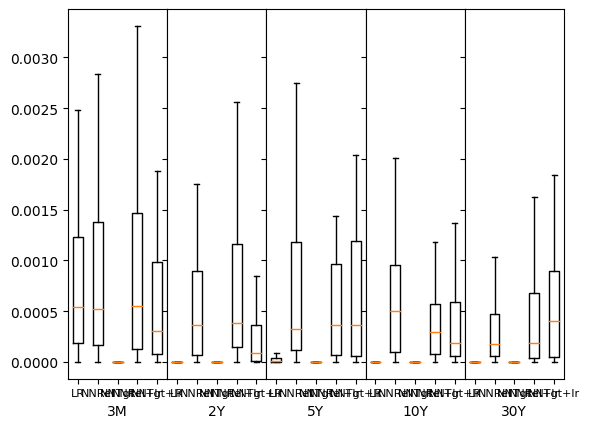

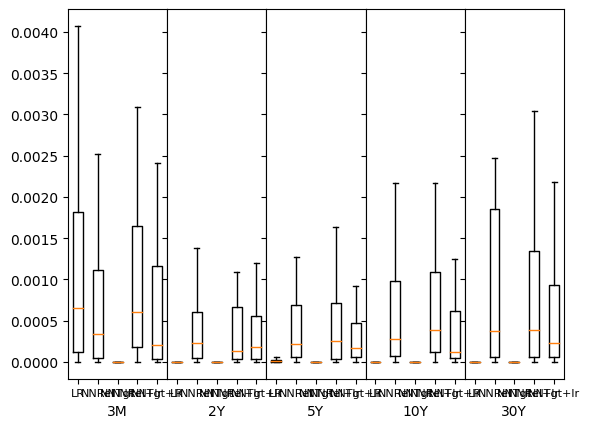

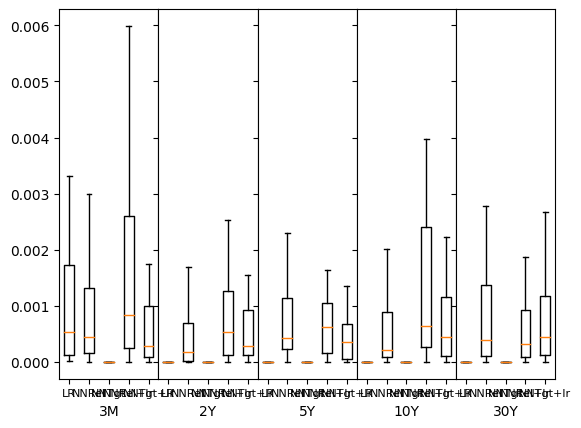

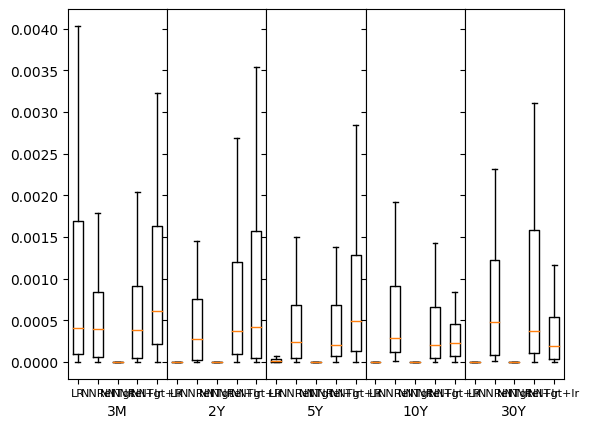

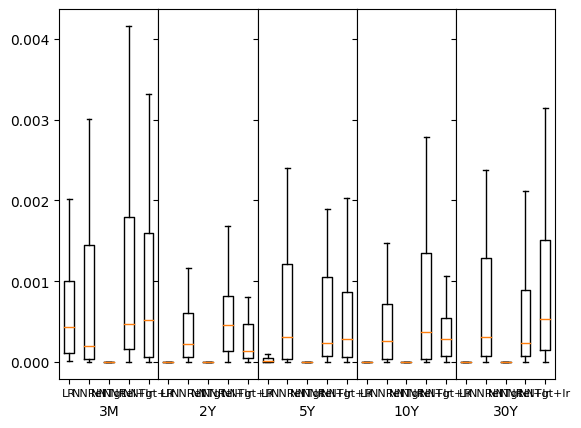

In [14]:
for i in range(len(horizons)):
    plot_function1(i)

In [15]:
table4_non_normalized = NN_RelFeat_non_normalized('GECU10YR_lag_1')

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.499e+00, tolerance: 1.288e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/800
33/33 [==============================] - 1s 10ms/step - loss: 1947862.5000 - mae: 1004.4180 - mse: 1947862.5000 - root_mean_squared_error: 1395.6584 - val_loss: 92081.0000 - val_mae: 242.1215 - val_mse: 92081.0000 - val_root_mean_squared_error: 303.4485
Epoch 2/800
33/33 [==============================] - 0s 4ms/step - loss: 108451.6641 - mae: 259.9021 - mse: 108451.6641 - root_mean_squared_error: 329.3200 - val_loss: 61044.2656 - val_mae: 201.2294 - val_mse: 61044.2656 - val_root_mean_squared_error: 247.0714
Epoch 3/800
33/33 [==============================] - 0s 4ms/step - loss: 55946.0312 - mae: 194.2415 - mse: 55946.0312 - root_mean_squared_error: 236.5291 - val_loss: 31146.6172 - val_mae: 148.7602 - val_mse: 31146.6172 - val_root_mean_squared_error: 176.4840
Epoch 4/800
33/33 [==============================] - 0s 4ms/step - loss: 43116.7227 - mae: 170.5946 - mse: 43116.7227 - root_mean_squared_error: 207.6457 - val_loss: 24148.9082 - val_mae: 130.1008 - val_mse: 24148.

In [16]:
normalised_metrics=fig_5['GECU10YR_lag_1']#NN_RelFeat('GECU10Y_lag_1')
non_normalised_metrics=table4_non_normalized
table_4_dict={'Error':['MAE','MSE','RMSE'],
              'Normalised Mean':[normalised_metrics['mae'],
                                 normalised_metrics['mse'],
                                 normalised_metrics['rmse_values']],
              'Normalised Std Dev': [normalised_metrics['std_dev_mae'],
                                    normalised_metrics['std_dev_mse'],
                                    normalised_metrics['std_rmse']],
              
              'Non-Normalised Mean':[non_normalised_metrics['mae'],
                                 non_normalised_metrics['mse'],
                                 non_normalised_metrics['rmse_values']],
              'Non-Normalised Std Dev': [non_normalised_metrics['std_dev_mae'],
                                    non_normalised_metrics['std_dev_mse'],
                                    non_normalised_metrics['std_rmse']]
             }

In [17]:
#convert table 4 dict into dataframe
df_table4=pd.DataFrame.from_dict(table_4_dict)

In [18]:
df_table4

,Error,Normalised Mean,Normalised Std Dev,Non-Normalised Mean,Non-Normalised Std Dev
0,MAE,0.021407,0.013403,0.311648,0.195675
1,MSE,0.000638,0.000667,0.135413,0.156342
2,RMSE,0.025257,0.013403,0.367986,0.195675


In [19]:
d = {'Actual 10Y Yield': fig_5['Actual_Yield'], 'Predicted 10Y Yield': fig_5['Predicted_Yield']}

In [20]:
df = pd.DataFrame(data=d)

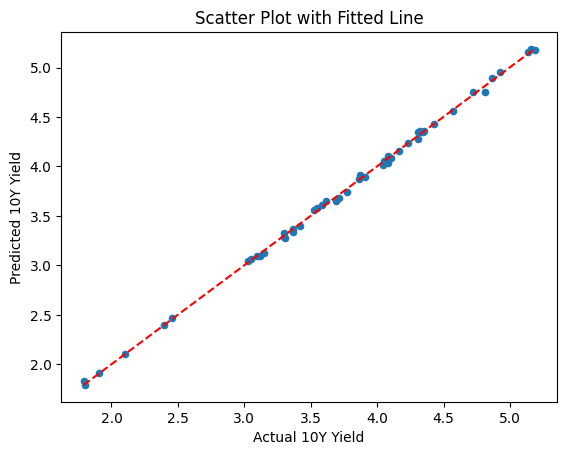

In [21]:
# Plotting the data

df = df.sort_values(by='Actual 10Y Yield')
df.plot(x='Actual 10Y Yield', y='Predicted 10Y Yield', kind='scatter', title='Scatter Plot with Fitted Line')

# Fit a line through the data using numpy.polyfit
fit = np.polyfit(df['Actual 10Y Yield'], df['Predicted 10Y Yield'], 1)

# Add the fitted line to the plot
plt.plot(df['Actual 10Y Yield'], np.polyval(fit, df['Actual 10Y Yield']), 'r--')


# Show the plot
plt.show()

In [22]:
def mlt_RelFeat(feature_of_Interest):
    
    '''
    Input: the feature that we are interested in. 
    
    returns a dictionary of metrics of the model
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    '''
    
    
    #feature_of_Interest=[list of interested features]'GECU2YR_lag_1'
    import pandas as pd, numpy as np
    import numpy as np
    from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_squared_error
    from sklearn.utils import resample
    from sklearn.preprocessing import StandardScaler,Normalizer
    import matplotlib.pyplot as plt
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, Dropout
    from tensorflow.keras.metrics import RootMeanSquaredError
    from sklearn.linear_model import LinearRegression
    
    df=pd.read_csv(file_paths)
    df.columns = df.columns.str.replace(' ', '')
    df.set_index("Date",inplace=True)
    #df = df.loc[:,df.columns != "Date"]
    df.interpolate(method ='linear', limit_direction ='both',inplace=True)
    
    # Load your CSV data (replace with your file path)
    data = df

    # Define the target column names (using the last 5 columns)
    target_columns = data.columns[-5:]

    # Generate lagged features for all features
    features_with_lags = pd.DataFrame()
    for feature in data.columns:
        lagged_features = []
        for i in range(1, 22,5):
            lagged_feature = data[feature].shift(i).rename(f"{feature}_lag_{i}")
            lagged_features.append(lagged_feature)
        # Include the feature itself
        lagged_features.append(data[feature])
        features_with_lags = pd.concat([features_with_lags, *lagged_features], axis=1)
    features_with_lags.interpolate(method ='linear', limit_direction ='both',inplace=True)
    #features_with_lags.dropna(inplace=True)
    # Apply LASSO feature selection separately per target and per forecasting horizon
    selected_features = pd.DataFrame(index=features_with_lags.columns)
    #features_with_lags.dropna(inplace=True)
    filtered_target_columns = [col for col in features_with_lags.columns if any(target in col for target in target_columns)]
    
    target_columns=feature_of_Interest

    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]
    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3,random_state=42)
    
    
    
    lasso_model = Lasso(alpha=0.001)
    lasso_model.fit(X_train, y_train)
    #selected_feature = np.sum(lasso_model.coef_ != 0)
    selected_columns = X_train.columns[lasso_model.coef_ != 0]
    
    
    #X_train, X_test, y_train, y_test = train_test_split(selected_columns[400:3400], y[400:3400], test_size=0.3, shuffle=True)
    # Assuming X_train and X_test are your feature sets
    #scaler = StandardScaler()
    #scaler.fit(X_train)
    X_train=X_train[list(selected_columns)]
    X_test=X_test[list(selected_columns)]
    # Normalize train and test sets
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    # Normalize train and test sets
    X_train_normalized = X_train
    X_test_normalized = X_test
    
    import random
    random.seed(42)  # Set a seed for reproducibility
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable
    
    # Define the model architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    #model.add(Dropout(0.2))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(len(feature_of_Interest), activation='linear'))
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])
    
    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=500, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))
    
    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)
    
    predictions = model.predict(X_test_forecast)
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast.values)**2)
    mae = np.mean(np.abs(predictions - y_test_forecast.values))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast.values))
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))
    mse_values=(predictions - y_test_forecast)**2
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2), 'Actual_Yield':y_test_forecast,
           'Predicted_Yield':predictions
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2), 'Actual_Yield':y_test_forecast,
           'Predicted_Yield':predictions
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2), 'Actual_Yield':y_test_forecast,
           'Predicted_Yield':predictions
          }
    return a


In [23]:

horizons_mlt=[1,21]
list_mse_mlt=[]
for i in horizons_mlt:
    by_maturity_mlt=[]
    for j in yields:
        #print(j+str(i))
        target_=j+str(i)
        #print(target_)
        q=mlt_RelFeat([target_])
        by_maturity_mlt.append([q])
    list_mse_mlt.append(by_maturity_mlt)

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.213e+00, tolerance: 3.975e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 3.3327 - mae: 1.4646 - mse: 3.3327 - root_mean_squared_error: 1.8256 - val_loss: 0.6405 - val_mae: 0.6085 - val_mse: 0.6405 - val_root_mean_squared_error: 0.8003
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.5205 - mae: 0.5186 - mse: 0.5205 - root_mean_squared_error: 0.7215 - val_loss: 0.2429 - val_mae: 0.3625 - val_mse: 0.2429 - val_root_mean_squared_error: 0.4928
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1347 - mae: 0.2762 - mse: 0.1347 - root_mean_squared_error: 0.3670 - val_loss: 0.1175 - val_mae: 0.2551 - val_mse: 0.1175 - val_root_mean_squared_error: 0.3428
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0669 - mae: 0.1998 - mse: 0.0669 - root_mean_squared_error: 0.2586 - val_loss: 0.0665 - val_mae: 0.1976 - val_mse: 0.0665 - val_root_mean_squared_error: 0.2578
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.474e+00, tolerance: 3.274e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 3.2730 - mae: 1.5122 - mse: 3.2730 - root_mean_squared_error: 1.8091 - val_loss: 0.4831 - val_mae: 0.5883 - val_mse: 0.4831 - val_root_mean_squared_error: 0.6951
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.4432 - mae: 0.5298 - mse: 0.4432 - root_mean_squared_error: 0.6658 - val_loss: 0.2592 - val_mae: 0.4133 - val_mse: 0.2592 - val_root_mean_squared_error: 0.5091
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2229 - mae: 0.3646 - mse: 0.2229 - root_mean_squared_error: 0.4721 - val_loss: 0.1664 - val_mae: 0.3473 - val_mse: 0.1664 - val_root_mean_squared_error: 0.4080
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1420 - mae: 0.2854 - mse: 0.1420 - root_mean_squared_error: 0.3768 - val_loss: 0.1156 - val_mae: 0.2994 - val_mse: 0.1156 - val_root_mean_squared_error: 0.3399
Epoch 5/500
33/33 [==============================] - 0s 4ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.137e+00, tolerance: 2.071e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 4.0318 - mae: 1.7332 - mse: 4.0318 - root_mean_squared_error: 2.0079 - val_loss: 0.5914 - val_mae: 0.6211 - val_mse: 0.5914 - val_root_mean_squared_error: 0.7690
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.2414 - mae: 0.3755 - mse: 0.2414 - root_mean_squared_error: 0.4913 - val_loss: 0.1457 - val_mae: 0.3100 - val_mse: 0.1457 - val_root_mean_squared_error: 0.3817
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1026 - mae: 0.2477 - mse: 0.1026 - root_mean_squared_error: 0.3204 - val_loss: 0.1054 - val_mae: 0.2590 - val_mse: 0.1054 - val_root_mean_squared_error: 0.3246
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0796 - mae: 0.2165 - mse: 0.0796 - root_mean_squared_error: 0.2822 - val_loss: 0.0861 - val_mae: 0.2352 - val_mse: 0.0861 - val_root_mean_squared_error: 0.2934
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.499e+00, tolerance: 1.288e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 7.4844 - mae: 2.5333 - mse: 7.4844 - root_mean_squared_error: 2.7358 - val_loss: 2.0087 - val_mae: 1.1679 - val_mse: 2.0087 - val_root_mean_squared_error: 1.4173
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 1.0578 - mae: 0.7592 - mse: 1.0578 - root_mean_squared_error: 1.0285 - val_loss: 0.5705 - val_mae: 0.5292 - val_mse: 0.5705 - val_root_mean_squared_error: 0.7553
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2668 - mae: 0.3868 - mse: 0.2668 - root_mean_squared_error: 0.5166 - val_loss: 0.2604 - val_mae: 0.3889 - val_mse: 0.2604 - val_root_mean_squared_error: 0.5103
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1257 - mae: 0.2782 - mse: 0.1257 - root_mean_squared_error: 0.3546 - val_loss: 0.1736 - val_mae: 0.3317 - val_mse: 0.1736 - val_root_mean_squared_error: 0.4167
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.246e+00, tolerance: 1.135e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 10.0118 - mae: 2.9173 - mse: 10.0118 - root_mean_squared_error: 3.1641 - val_loss: 3.7422 - val_mae: 1.5857 - val_mse: 3.7422 - val_root_mean_squared_error: 1.9345
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 1.5439 - mae: 0.9536 - mse: 1.5439 - root_mean_squared_error: 1.2425 - val_loss: 1.0381 - val_mae: 0.8396 - val_mse: 1.0381 - val_root_mean_squared_error: 1.0189
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.4596 - mae: 0.5155 - mse: 0.4596 - root_mean_squared_error: 0.6779 - val_loss: 0.3482 - val_mae: 0.4744 - val_mse: 0.3482 - val_root_mean_squared_error: 0.5901
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.2204 - mae: 0.3705 - mse: 0.2204 - root_mean_squared_error: 0.4695 - val_loss: 0.2070 - val_mae: 0.3606 - val_mse: 0.2070 - val_root_mean_squared_error: 0.4550
Epoch 5/500
33/33 [==============================] - 0s 4m

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.013e+00, tolerance: 3.936e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 3.3834 - mae: 1.4950 - mse: 3.3834 - root_mean_squared_error: 1.8394 - val_loss: 0.5226 - val_mae: 0.6329 - val_mse: 0.5226 - val_root_mean_squared_error: 0.7229
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.2339 - mae: 0.3810 - mse: 0.2339 - root_mean_squared_error: 0.4836 - val_loss: 0.0856 - val_mae: 0.2390 - val_mse: 0.0856 - val_root_mean_squared_error: 0.2926
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.0857 - mae: 0.2189 - mse: 0.0857 - root_mean_squared_error: 0.2927 - val_loss: 0.0643 - val_mae: 0.1989 - val_mse: 0.0643 - val_root_mean_squared_error: 0.2536
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.0665 - mae: 0.1935 - mse: 0.0665 - root_mean_squared_error: 0.2579 - val_loss: 0.0528 - val_mae: 0.1827 - val_mse: 0.0528 - val_root_mean_squared_error: 0.2297
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.693e+00, tolerance: 3.243e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 3.2334 - mae: 1.5132 - mse: 3.2334 - root_mean_squared_error: 1.7982 - val_loss: 0.7984 - val_mae: 0.8011 - val_mse: 0.7984 - val_root_mean_squared_error: 0.8935
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3719 - mae: 0.4938 - mse: 0.3719 - root_mean_squared_error: 0.6099 - val_loss: 0.1071 - val_mae: 0.2689 - val_mse: 0.1071 - val_root_mean_squared_error: 0.3272
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0972 - mae: 0.2524 - mse: 0.0972 - root_mean_squared_error: 0.3118 - val_loss: 0.0544 - val_mae: 0.1939 - val_mse: 0.0544 - val_root_mean_squared_error: 0.2331
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.0579 - mae: 0.1911 - mse: 0.0579 - root_mean_squared_error: 0.2406 - val_loss: 0.0371 - val_mae: 0.1549 - val_mse: 0.0371 - val_root_mean_squared_error: 0.1927
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.217e+00, tolerance: 2.026e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 19ms/step - loss: 5.0387 - mae: 1.9485 - mse: 5.0387 - root_mean_squared_error: 2.2447 - val_loss: 2.2476 - val_mae: 1.2593 - val_mse: 2.2476 - val_root_mean_squared_error: 1.4992
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.9055 - mae: 0.7475 - mse: 0.9055 - root_mean_squared_error: 0.9516 - val_loss: 0.4937 - val_mae: 0.5585 - val_mse: 0.4937 - val_root_mean_squared_error: 0.7026
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.2486 - mae: 0.3886 - mse: 0.2486 - root_mean_squared_error: 0.4986 - val_loss: 0.2100 - val_mae: 0.3573 - val_mse: 0.2100 - val_root_mean_squared_error: 0.4583
Epoch 4/500
33/33 [==============================] - 0s 5ms/step - loss: 0.1441 - mae: 0.2947 - mse: 0.1441 - root_mean_squared_error: 0.3796 - val_loss: 0.1310 - val_mae: 0.2741 - val_mse: 0.1310 - val_root_mean_squared_error: 0.3619
Epoch 5/500
33/33 [==============================] - 0s 4ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.449e+00, tolerance: 1.261e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 6.1150 - mae: 2.2035 - mse: 6.1150 - root_mean_squared_error: 2.4728 - val_loss: 1.0656 - val_mae: 0.8976 - val_mse: 1.0656 - val_root_mean_squared_error: 1.0323
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.5227 - mae: 0.5772 - mse: 0.5227 - root_mean_squared_error: 0.7230 - val_loss: 0.2091 - val_mae: 0.3687 - val_mse: 0.2091 - val_root_mean_squared_error: 0.4573
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1826 - mae: 0.3423 - mse: 0.1826 - root_mean_squared_error: 0.4274 - val_loss: 0.1388 - val_mae: 0.2979 - val_mse: 0.1388 - val_root_mean_squared_error: 0.3725
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1241 - mae: 0.2802 - mse: 0.1241 - root_mean_squared_error: 0.3522 - val_loss: 0.1063 - val_mae: 0.2515 - val_mse: 0.1063 - val_root_mean_squared_error: 0.3260
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.248e+00, tolerance: 1.102e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 10.6002 - mae: 2.9949 - mse: 10.6002 - root_mean_squared_error: 3.2558 - val_loss: 3.9767 - val_mae: 1.6409 - val_mse: 3.9767 - val_root_mean_squared_error: 1.9942
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 3.2729 - mae: 1.4223 - mse: 3.2729 - root_mean_squared_error: 1.8091 - val_loss: 0.5506 - val_mae: 0.5653 - val_mse: 0.5506 - val_root_mean_squared_error: 0.7420
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.7834 - mae: 0.6823 - mse: 0.7834 - root_mean_squared_error: 0.8851 - val_loss: 0.3891 - val_mae: 0.4642 - val_mse: 0.3891 - val_root_mean_squared_error: 0.6238
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.3060 - mae: 0.4279 - mse: 0.3060 - root_mean_squared_error: 0.5531 - val_loss: 0.2001 - val_mae: 0.3309 - val_mse: 0.2001 - val_root_mean_squared_error: 0.4473
Epoch 5/500
33/33 [==============================] - 0s 3m

In [24]:

axis=['3M','2Y','5Y','10Y','30Y']
def plot_stl_mtl(i):
    
    '''
    
    Function generates the graphs
    
    Input: number of horizons 
    
    returns the plot data as a nested list
    
    '''
    
    data = []

    for j in range(0, 5):
        list1 = []
        key = axis[j]
        if isinstance(list_mse[i][j][1], pd.DataFrame):
            list1.append(list_mse[i][j][1].values.flatten())
            mse_values = list_mse_mlt[i][j][0]['mse_values']
            if isinstance(mse_values, pd.DataFrame):
                list1.append(mse_values.values.flatten())
            elif isinstance(mse_values, np.ndarray):
                list1.append(mse_values.flatten())
            else:
                list1.append(mse_values)
        elif isinstance(list_mse[i][j][1], np.ndarray):
            list1.append(list_mse[i][j][1].flatten())
            mse_values = list_mse_mlt[i][j][0]['mse_values']
            if isinstance(mse_values, pd.DataFrame):
                list1.append(mse_values.values.flatten())
            elif isinstance(mse_values, np.ndarray):
                list1.append(mse_values.flatten())
            else:
                list1.append(mse_values)
        else:
            list1.append(list_mse[i][j][1])
            mse_values = list_mse_mlt[i][j][0]['mse_values']
            if isinstance(mse_values, pd.DataFrame):
                list1.append(mse_values.values.flatten())
            elif isinstance(mse_values, np.ndarray):
                list1.append(mse_values.flatten())
            else:
                list1.append(mse_values)
        data.append([key, list1])
    attemptlist = ['STL','MTL'] 
    fig, axes = plt.subplots(ncols= len(data), sharey=True)
    fig.subplots_adjust(wspace=0)
    for ax,d in zip(axes,data):     
        ax.boxplot([d[1][attemptlist.index(attempt)] for attempt in attemptlist],showfliers=False)
        ax.set(xticklabels=attemptlist, xlabel=d[0])
        ax.set_xticklabels(attemptlist, fontsize=8)
    plt.show()

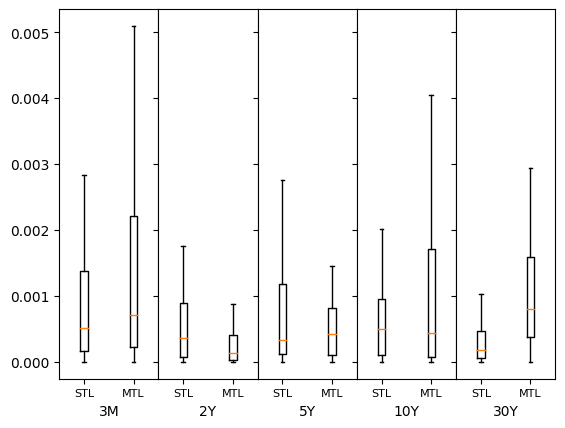

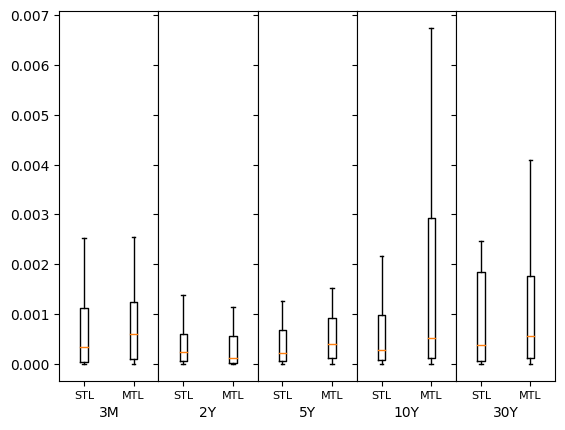

In [25]:
for i in range(len(horizons_mlt)):
    plot_stl_mtl(i)
    